# Duplicate detection - step 2: review and decide on candidate pairs

This notebook runs the second part of the duplicate detection algorithm on a dataframe with the following columns:

- `archiveType`       (used for duplicate detection algorithm)
- `dataSetName`
- `datasetId`
- `geo_meanElev`      (used for duplicate detection algorithm)
- `geo_meanLat`       (used for duplicate detection algorithm)
- `geo_meanLon`       (used for duplicate detection algorithm)
- `geo_siteName`      (used for duplicate detection algorithm)
- `interpretation_direction`
- `interpretation_seasonality`
- `interpretation_variable`
- `interpretation_variableDetails`
- `originalDataURL`
- `originalDatabase`
- `paleoData_notes`
- `paleoData_proxy`   (used for duplicate detection algorithm)
- `paleoData_units`
- `paleoData_values`  (used for duplicate detection algorithm, test for correlation, RMSE, correlation of 1st difference, RMSE of 1st difference)
- `paleoData_variableName`
- `year`              (used for duplicate detection algorithm)
- `yearUnits`

This interactive notebook runs a duplicate decision algorithm for a specific database, following the identification of the potential duplicate candidate pairs. The algorithm walks the operator through each of the detected duplicate candidate pairs from `dup_detection.ipynb` and runs a decision process to decide whether to keep or reject the identified records. 

The confirmed 'true' duplicates are saved in

`data/DATABASENAME/duplicate_detection/duplicate_decisions_DATABASENAME_AUTHORINITIALS_YY-MM-DD.csv`

10/11/2025 LL: tidied up with revised data organisation and prepared for documentation
27/11/2024 LL: Changed hierarchy FE23>PAGES 2k
22/10/2024 v1: Updated the decision process:
    - created backup decision file which is intermediately saved
    - outputs URL which can be copied and pasted into browser
    - implemented a composite option in the decision process, to create a composite of two records

Author: Lucie Luecke, created 27/9/2024



**Note**: The algorithm can be either started from scratch or from a backup file:


## Intialisation

### Set up working environment

Make sure the repo_root is added correctly, it should be: your_root_dir/dod2k
This should be the working directory throughout this notebook (and all other notebooks).

In [11]:
%load_ext autoreload
%autoreload 2

import sys
import os
from pathlib import Path

# Add parent directory to path (works from any notebook in notebooks/)
# the repo_root should be the parent directory of the notebooks folder
current_dir = Path().resolve()
# Determine repo root
if current_dir.name == 'dod2k': repo_root = current_dir
elif current_dir.parent.name == 'dod2k': repo_root = current_dir.parent
else: raise Exception('Please review the repo root structure (see first cell).')

# Update cwd and path only if needed
if os.getcwd() != str(repo_root):
    os.chdir(repo_root)
if str(repo_root) not in sys.path:
    sys.path.insert(0, str(repo_root))

print(f"Repo root: {repo_root}")
if str(os.getcwd())==str(repo_root):
    print(f"Working directory matches repo root. ")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Repo root: /home/jupyter-lluecke/dod2k_v2.0/dod2k
Working directory matches repo root. 


In [12]:
import pandas as pd
import numpy as np
import datetime

from dod2k_utilities import ut_functions as utf # contains utility functions
from dod2k_utilities import ut_duplicate_search as dup # contains utility functions

### Load dataset

Define the dataset which needs to be screened for duplicates. Input files for the duplicate detection mechanism need to be compact dataframes (`pandas` dataframes with standardised columns and entry formatting). 

The function `load_compact_dataframe_from_csv` loads the dataframe from a `csv` file from `data\DB\`, with `DB` the name of the database. The database name (`db_name`) can be 
- `pages2k`
- `ch2k`
- `iso2k`
- `sisal`
- `fe23`

for the individual databases, 

or use 

- `all_merged`

to load the merged database of all individual databases, or can be any user defined compact dataframe.

In [13]:
# load dataframe
db_name='all_merged' 
# db_name='dup_test' 
df = utf.load_compact_dataframe_from_csv(db_name)

print(df.info())
df.name = db_name


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5320 entries, 0 to 5319
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   archiveType                    5320 non-null   object 
 1   dataSetName                    5320 non-null   object 
 2   datasetId                      5320 non-null   object 
 3   geo_meanElev                   5221 non-null   float32
 4   geo_meanLat                    5320 non-null   float32
 5   geo_meanLon                    5320 non-null   float32
 6   geo_siteName                   5320 non-null   object 
 7   interpretation_direction       5320 non-null   object 
 8   interpretation_seasonality     5320 non-null   object 
 9   interpretation_variable        5320 non-null   object 
 10  interpretation_variableDetail  5320 non-null   object 
 11  originalDataURL                5320 non-null   object 
 12  originalDatabase               5320 non-null   o

### Input operator's credentials

In order to keep maximum transparency and reproduceability, put in the operator's credentials here.

These details are used to flag the intermediate output files and provided along with the final duplicate free dataset.


In [14]:
initials = 'LL'
fullname = 'Lucie Luecke'
email    = 'ljluec1@st-andrews.ac.uk'

# initials = 'MNE'
# fullname = 'Michael Evans'
# email    = 'mnevans@umd.edu'
operator_details = [initials, fullname, email]

## Duplicate decision process

We now start the duplicate decision process.

### Hierarchy for duplicate removal for identical duplicates

For automated decisions, which apply to *identical* duplicates, we now define a hierarchy of databases, which decides which record should be kept.

First, list all the original databases:

In [15]:
for db in df.originalDatabase.unique():
    print(db)

PAGES 2k v2.2.0
FE23 (Breitenmoser et al. (2014))
CoralHydro2k v1.0.1
Iso2k v1.1.2
SISAL v3


Now assign a hierarchy to the original databases. For $n$ original databases the hierarchy ranges from 1, the highest hierarchical value (should always be kept), to the lowest value $n$ (the lowest in the hierarchy)

In [17]:
# implement hierarchy for automated decisions for identical records

df = dup.define_hierarchy(df, hierarchy='default')

### Duplicate decision process

The following cell takes you through the potential duplicate candidate pairs and lets you decide whether to 
- keep both records
- keep just one record
- delete both records
- create composite of both records.

Recollections and updates of duplicates are automatically selected, as well as identical duplicates following the hierarchy defined above. 

The output is saved in `data/DB/dup_detection/dup_decisions_dod2k_dupfree_INITIALS_DATE.csv`

Summary figures are saved in `figs/DB/dup_detection/`, also linked in the output csv file.


**Note**: The operator has the option to restart the decision process from a backup file in the directory `data/DB/dup_detection`. This can be especially useful should the connection be interrupted during the process. 

In [18]:
df.index

RangeIndex(start=0, stop=5320, step=1)

You now have the option to implement an automatic choice for specific database combinations. Please also specify a reason!

This is for records which do not satisfy the hierarchy criterion, i.e. records with different data but identical metadata, such as updated records. 

If you do not wish to do this, delete `automate_db_choice` from kwargs or set to `False` (default).

In [19]:
automate_db_choice = {'preferred_db': 'FE23 (Breitenmoser et al. (2014))', 
                      'rejected_db': 'PAGES 2k v2.2.0', 
                      'reason': 'conservative replication requirement'}

Found backup file (data/all_merged/dup_detection/dup_decisions_all_merged_LL_BACKUP.csv). Do you want to start decision process from the backup file? [y/n] y


header [' Decisions for duplicate candidate pairs. ', ' Operated by Lucie Luecke (LL)', ' E-Mail: ljluec1@st-andrews.ac.uk', ' Created on: 2025-12-11 12:50:32.105195 (UTC)', 'index 1,index 2,figure path,datasetId 1,datasetId 2,originalDatabase 1,originalDatabase 2,geo_siteName 1,geo_siteName 2,geo_meanLat 1,geo_meanLat 2,geo_meanLon 1,geo_meanLon 2,geo_meanElevation 1,geo_meanElevation 2,archiveType 1,archiveType 2,paleoData_proxy 1,paleoData_proxy 2,originalDataURL 1,originalDataURL 2,year 1,year 2,Decision 1,Decision 2,Decision type,Decision comment']
data [['0', '4408', 'no figure', 'pages2k_0', 'iso2k_296', 'PAGES 2k v2.2.0', 'Iso2k v1.1.2', 'WDC05A', 'WDC05A', '-79.45999908447266', '-79.45999908447266', '-112.08999633789062', '-112.08999633789062', '1806.0', '1806.0', 'GlacierIce', 'GlacierIce', 'd18O', 'd18O', 'https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ant-WDC05A.Steig.2013.txt', 'https://www.ncdc.noaa.gov/paleo/study/22531',

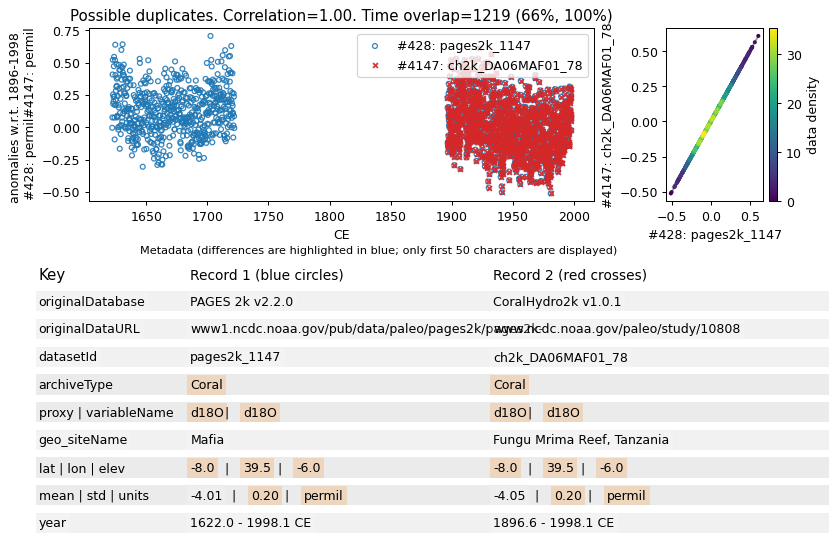

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
............................................................
     - Dataset ID          : ch2k_DA06MAF02_104
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10808


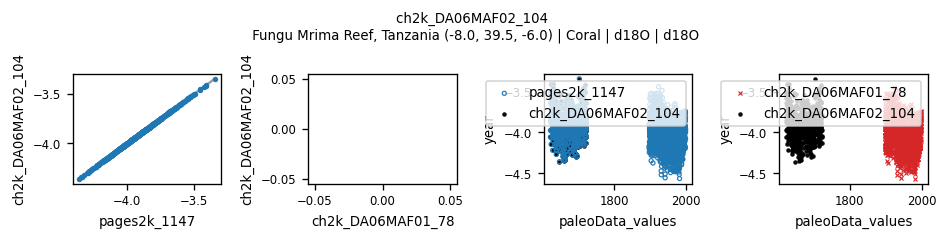

............................................................
     - Dataset ID          : iso2k_1748
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10808


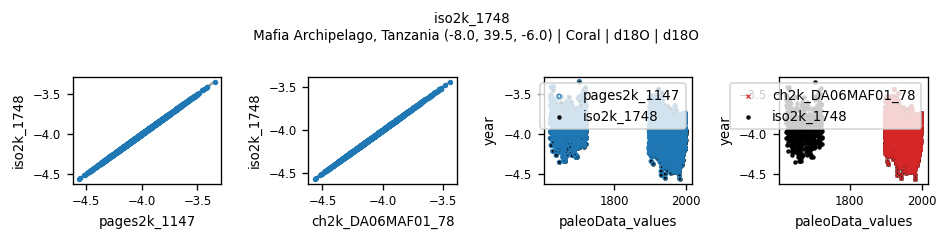

---------------------------------------------------------------------------------------------------------


99/429: **DECISION** Keep record 1 (pages2k_1147, blue circles) [1], record 2 (ch2k_DA06MAF01_78, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/098_pages2k_1147_ch2k_DA06MAF01_78__428_4147.jpg
KEEP RED CROSSES: remove pages2k_1147, keep ch2k_DA06MAF01_78.
write decision to backup file
428 4153 98 99
> 100/429,pages2k_1147,ch2k_DA06MAF02_104,0.0,1.0
=== POTENTIAL DUPLICATE 99/429: pages2k_1147+ch2k_DA06MAF02_104 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Mafia.Damassa.2006.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/10808   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False


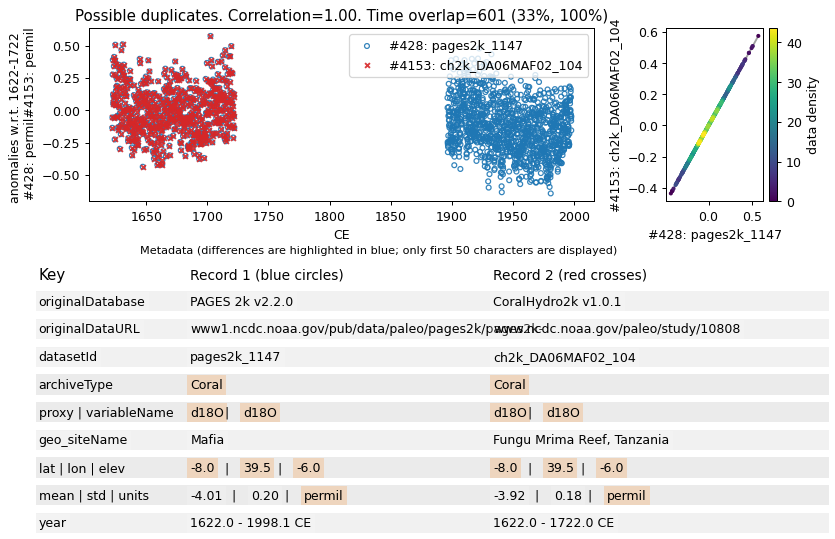

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
............................................................
     - Dataset ID          : ch2k_DA06MAF01_78
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10808


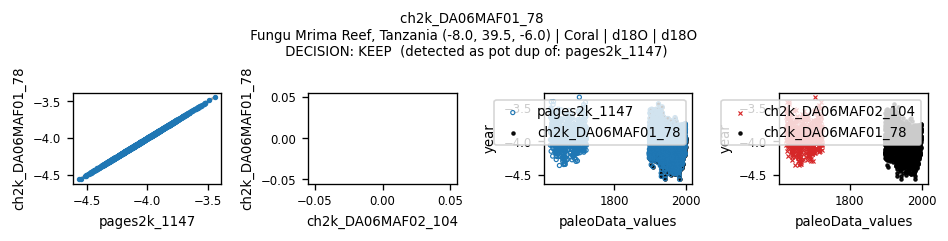

............................................................
     - Dataset ID          : iso2k_1748
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10808


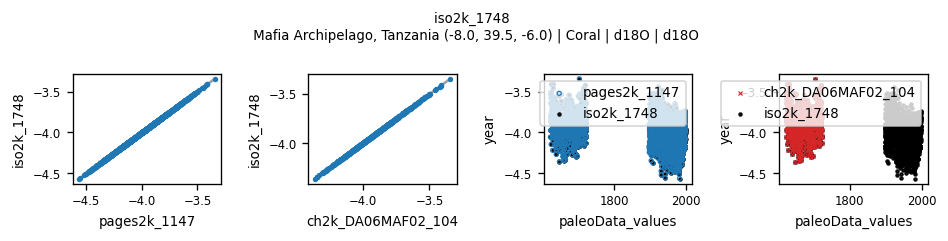

---------------------------------------------------------------------------------------------------------


100/429: **DECISION** Keep record 1 (pages2k_1147, blue circles) [1], record 2 (ch2k_DA06MAF02_104, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/099_pages2k_1147_ch2k_DA06MAF02_104__428_4153.jpg
KEEP RED CROSSES: remove pages2k_1147, keep ch2k_DA06MAF02_104.
write decision to backup file
428 4719 98 100
> 101/429,pages2k_1147,iso2k_1748,0.0,1.0
=== POTENTIAL DUPLICATE 100/429: pages2k_1147+iso2k_1748 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Mafia.Damassa.2006.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/10808   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_1147, keep iso2k_1748.
write decision to backup file
43

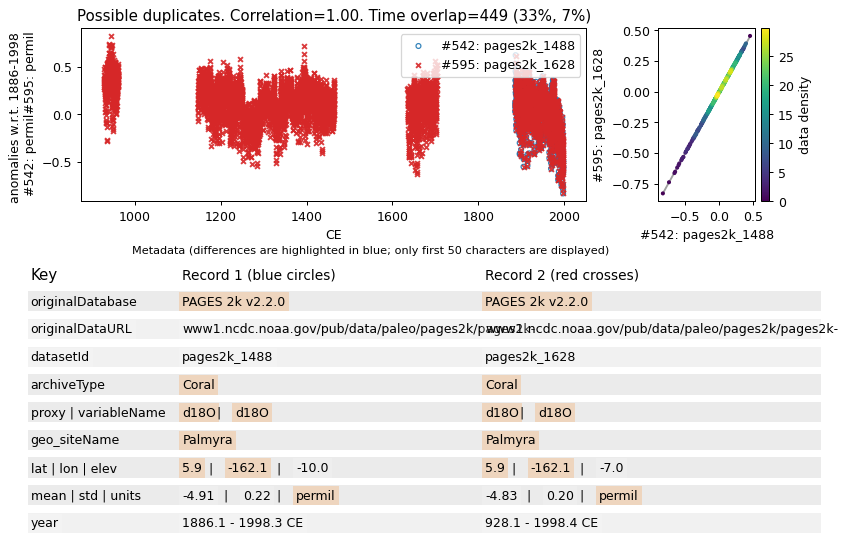

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
............................................................
     - Dataset ID          : ch2k_NU11PAL01_52
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10373


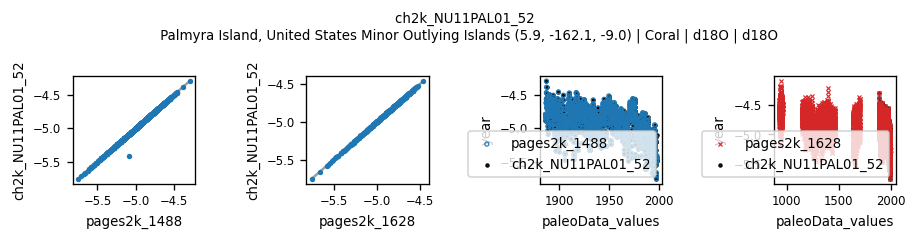

............................................................
     - Dataset ID          : iso2k_505
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/1875


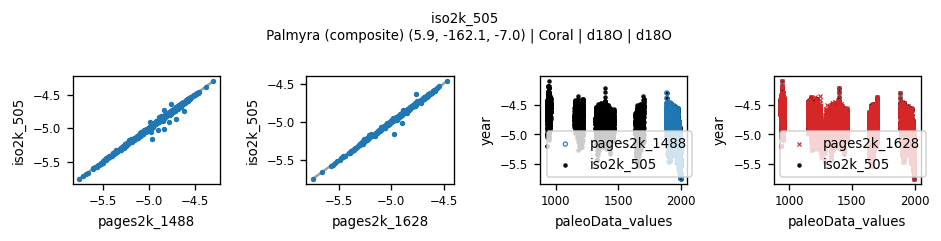

............................................................
     - Dataset ID          : iso2k_579
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10373


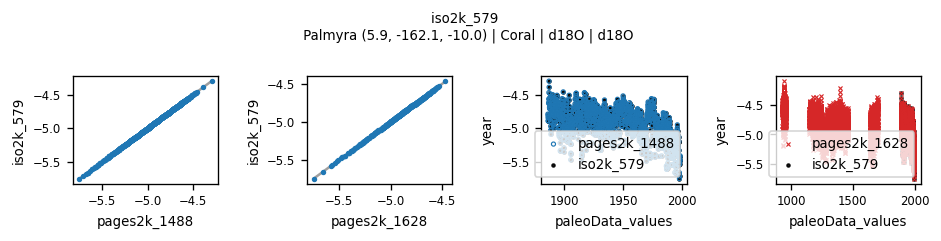

---------------------------------------------------------------------------------------------------------


117/429: **DECISION** Keep record 1 (pages2k_1488, blue circles) [1], record 2 (pages2k_1628, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/116_pages2k_1488_pages2k_1628__542_595.jpg
KEEP RED CROSSES: remove pages2k_1488, keep pages2k_1628.
write decision to backup file
542 4138 98 117
> 118/429,pages2k_1488,ch2k_NU11PAL01_52,0.4697858835846662,0.9992710430546085
=== POTENTIAL DUPLICATE 117/429: pages2k_1488+ch2k_NU11PAL01_52 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Palmyra.Nurhati.2011-1.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/10373   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  True
RECORDS IDENTICAL (perfect correlation) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_1488, keep ch2

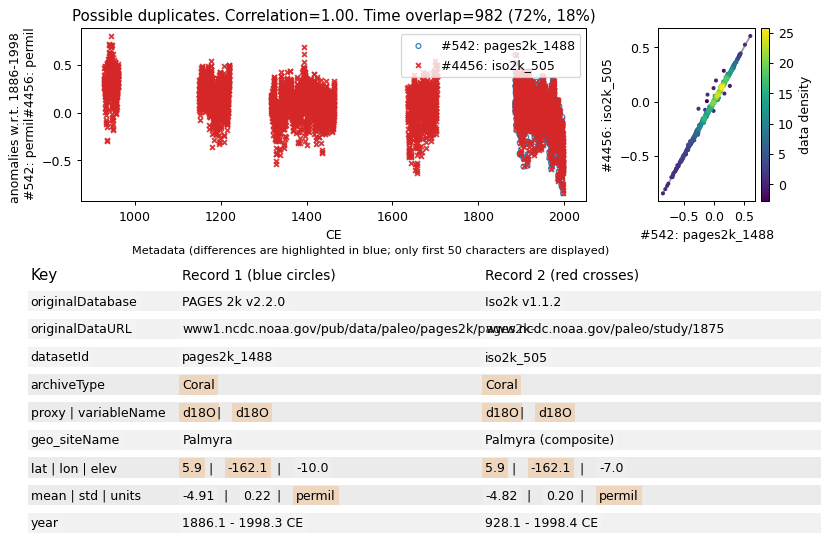

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
............................................................
     - Dataset ID          : pages2k_1628
     - URL                 : https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Palmyra.Cobb.2003.txt


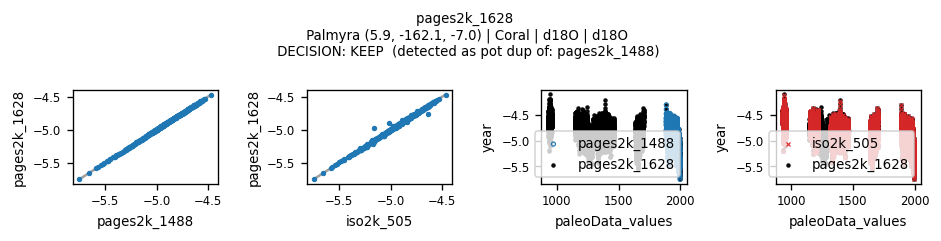

............................................................
     - Dataset ID          : ch2k_NU11PAL01_52
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10373


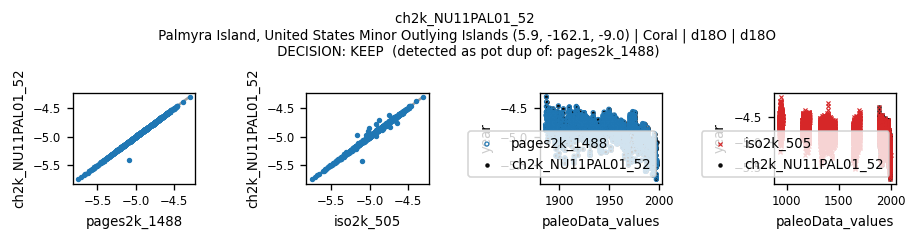

............................................................
     - Dataset ID          : iso2k_579
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10373


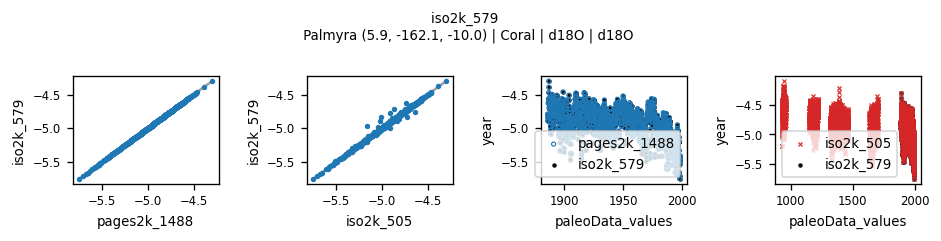

---------------------------------------------------------------------------------------------------------


119/429: **DECISION** Keep record 1 (pages2k_1488, blue circles) [1], record 2 (iso2k_505, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/118_pages2k_1488_iso2k_505__542_4456.jpg
KEEP BLUE CIRCLES: keep pages2k_1488, remove iso2k_505.
write decision to backup file
542 4482 98 119
> 120/429,pages2k_1488,iso2k_579,0.0,1.0
=== POTENTIAL DUPLICATE 119/429: pages2k_1488+iso2k_579 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Palmyra.Nurhati.2011-1.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/10373   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_1488, keep iso2k_579.
write decision to backup file
543 4139 98 120
> 1

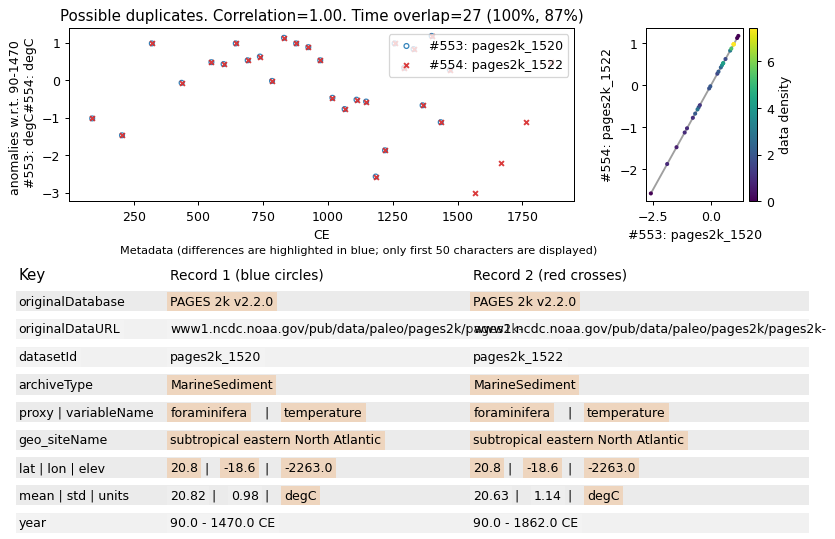

**Decision required for this duplicate pair (see figure above).**


125/429: **DECISION** Keep record 1 (pages2k_1520, blue circles) [1], record 2 (pages2k_1522, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/124_pages2k_1520_pages2k_1522__553_554.jpg
KEEP RED CROSSES: remove pages2k_1520, keep pages2k_1522.
write decision to backup file
564 4396 98 125
> 126/429,pages2k_1547,iso2k_259,0.0,1.0
=== POTENTIAL DUPLICATE 125/429: pages2k_1547+iso2k_259 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Kiritimati.Evans.1998.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/1847   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  False
lat True lon True elevation False archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_1547, keep iso2k_259.
write decision to backup file
573 1712 98 126

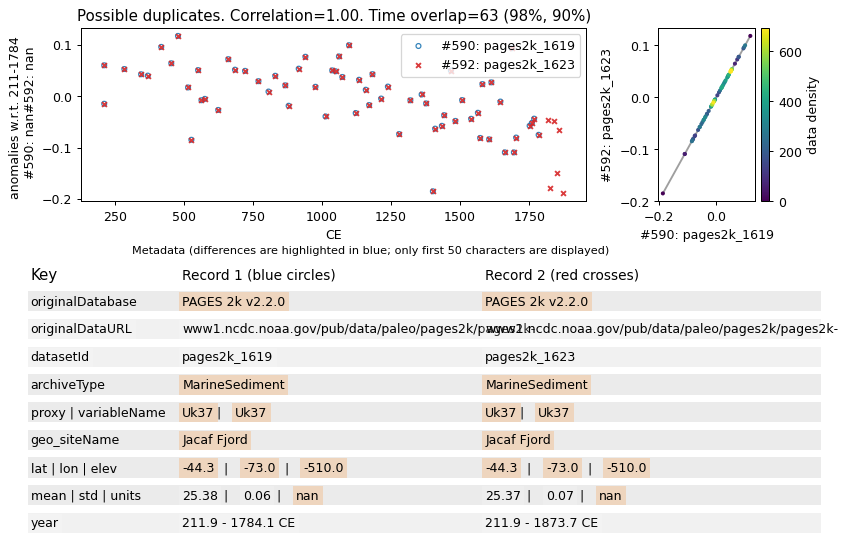

**Decision required for this duplicate pair (see figure above).**


129/429: **DECISION** Keep record 1 (pages2k_1619, blue circles) [1], record 2 (pages2k_1623, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/128_pages2k_1619_pages2k_1623__590_592.jpg
KEEP RED CROSSES: remove pages2k_1619, keep pages2k_1623.
write decision to backup file
595 4138 98 129
> 130/429,pages2k_1628,ch2k_NU11PAL01_52,0.4697858835846662,0.9999312398195646
=== POTENTIAL DUPLICATE 129/429: pages2k_1628+ch2k_NU11PAL01_52 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Palmyra.Cobb.2003.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/10373   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  False
lat True lon True elevation False archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False


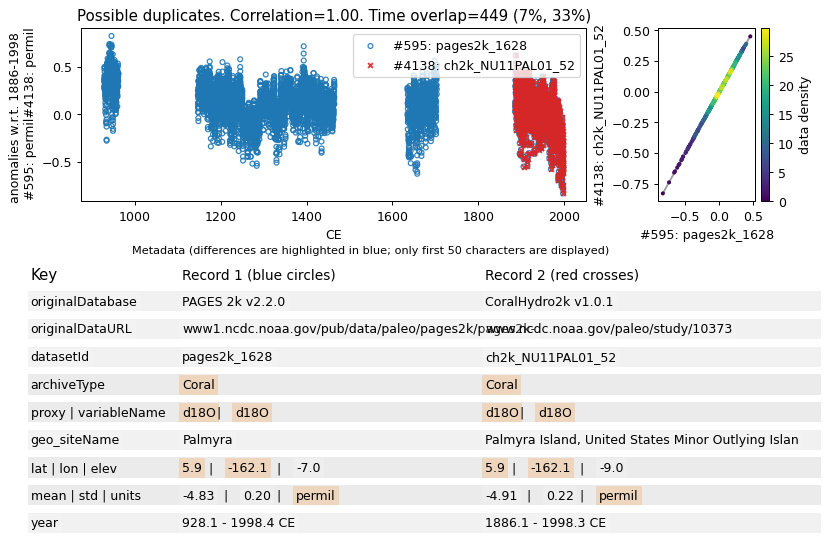

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  pages2k_1488
............................................................
     - Dataset ID          : iso2k_505
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/1875


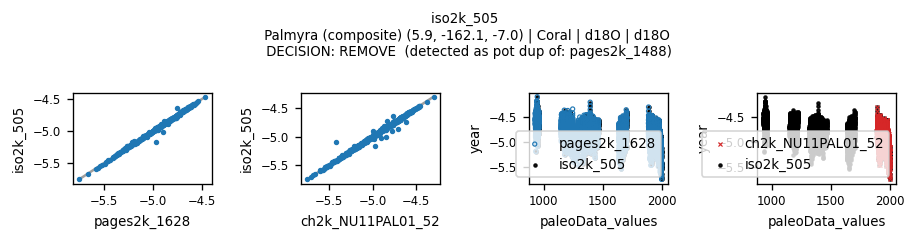

............................................................
     - Dataset ID          : iso2k_579
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10373


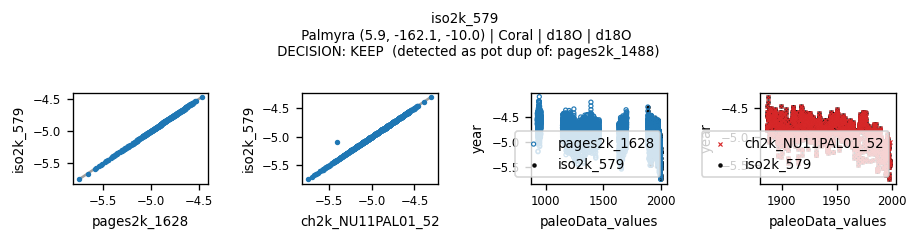

---------------------------------------------------------------------------------------------------------


130/429: **DECISION** Keep record 1 (pages2k_1628, blue circles) [1], record 2 (ch2k_NU11PAL01_52, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/129_pages2k_1628_ch2k_NU11PAL01_52__595_4138.jpg
KEEP BLUE CIRCLES: keep pages2k_1628, remove ch2k_NU11PAL01_52.
write decision to backup file
595 4456 98 130
> 131/429,pages2k_1628,iso2k_505,0.0,0.9973624471178902
=== POTENTIAL DUPLICATE 130/429: pages2k_1628+iso2k_505 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Palmyra.Cobb.2003.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/1875   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False


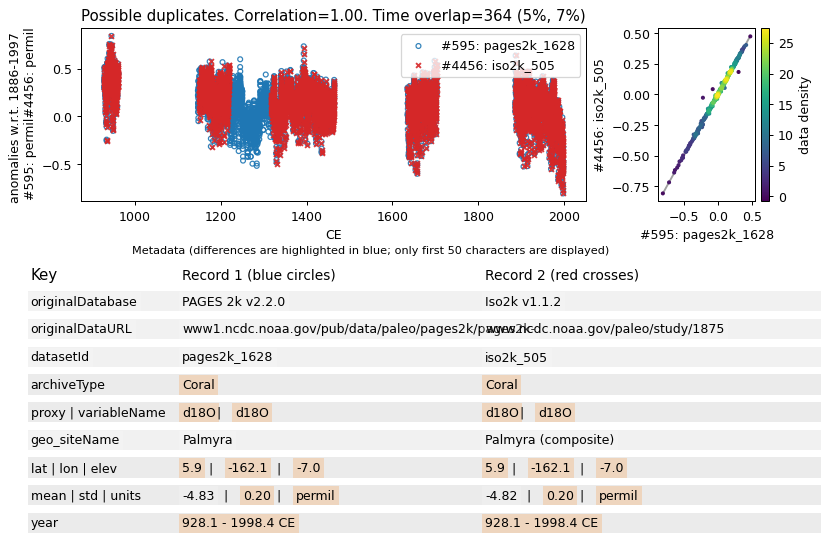

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  pages2k_1488
............................................................
     - Dataset ID          : ch2k_NU11PAL01_52
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10373


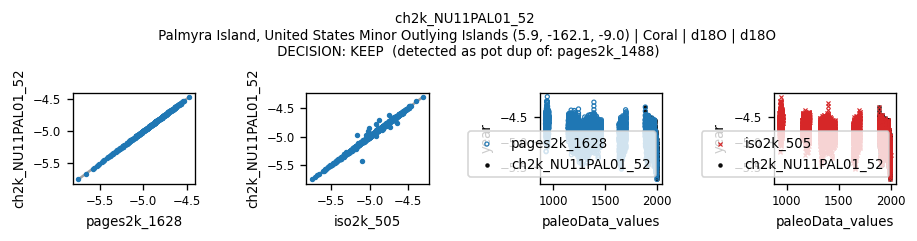

............................................................
     - Dataset ID          : iso2k_579
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10373


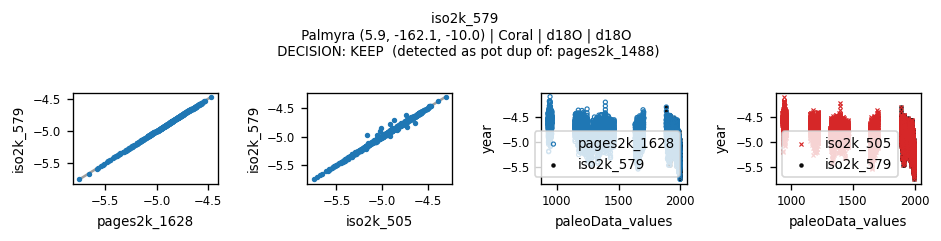

---------------------------------------------------------------------------------------------------------


131/429: **DECISION** Keep record 1 (pages2k_1628, blue circles) [1], record 2 (iso2k_505, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/130_pages2k_1628_iso2k_505__595_4456.jpg
KEEP BLUE CIRCLES: keep pages2k_1628, remove iso2k_505.
write decision to backup file
595 4482 98 131
> 132/429,pages2k_1628,iso2k_579,0.0,0.9999312398195646
=== POTENTIAL DUPLICATE 131/429: pages2k_1628+iso2k_579 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Palmyra.Cobb.2003.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/10373   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  False
lat True lon True elevation False archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  False
correlation_perfect:  False


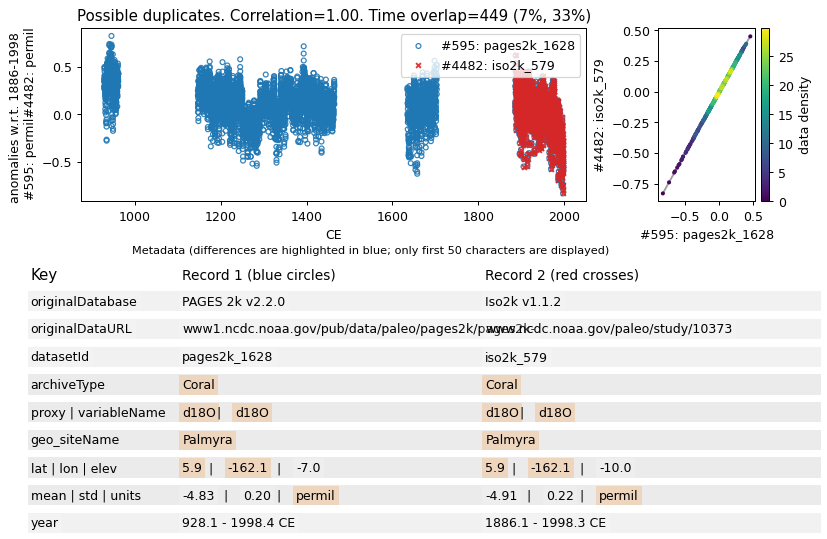

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  pages2k_1488
............................................................
     - Dataset ID          : ch2k_NU11PAL01_52
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10373


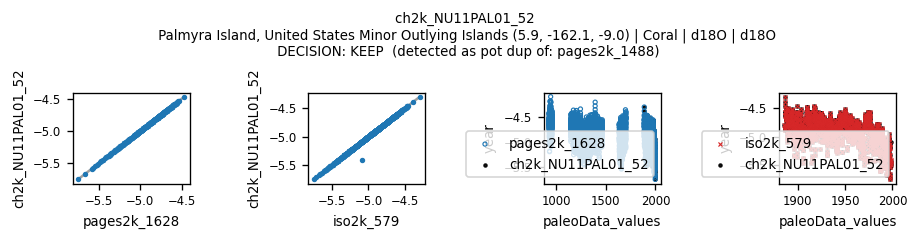

............................................................
     - Dataset ID          : iso2k_505
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/1875


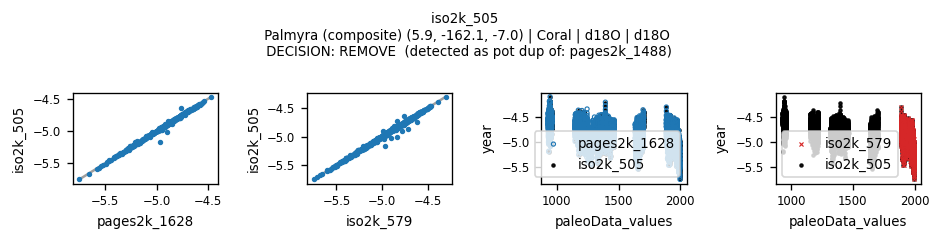

---------------------------------------------------------------------------------------------------------


132/429: **DECISION** Keep record 1 (pages2k_1628, blue circles) [1], record 2 (iso2k_579, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/131_pages2k_1628_iso2k_579__595_4482.jpg
KEEP BLUE CIRCLES: keep pages2k_1628, remove iso2k_579.
write decision to backup file
597 4030 98 132
> 133/429,pages2k_1636,FE23_northamerica_usa_wa081,6.762315219649745,0.9980630247518526
=== POTENTIAL DUPLICATE 132/429: pages2k_1636+FE23_northamerica_usa_wa081 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/NAm-MtStHelens.Briffa.1996-1.txt   ===
=== URL 2: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/usa/wa081-noaa.rwl   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False
Automated choice. Metadata identical, automatically choose FE23

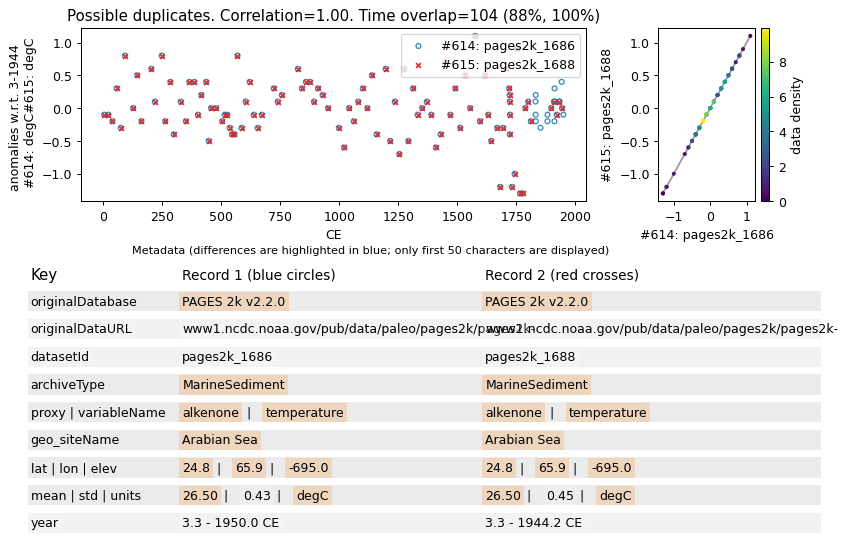

**Decision required for this duplicate pair (see figure above).**


134/429: **DECISION** Keep record 1 (pages2k_1686, blue circles) [1], record 2 (pages2k_1688, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: b


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/133_pages2k_1686_pages2k_1688__614_615.jpg
KEEP BOTH: keep pages2k_1686, keep pages2k_1688.
write decision to backup file
617 2421 98 134
> 135/429,pages2k_1692,FE23_asia_mong012,1.040938228538874,0.981578554195544
=== POTENTIAL DUPLICATE 134/429: pages2k_1692+FE23_asia_mong012 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Asi-MONG012.Jacoby.2006.txt   ===
=== URL 2: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/asia/mong012-noaa.rwl   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  False
lat True lon True elevation False archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False


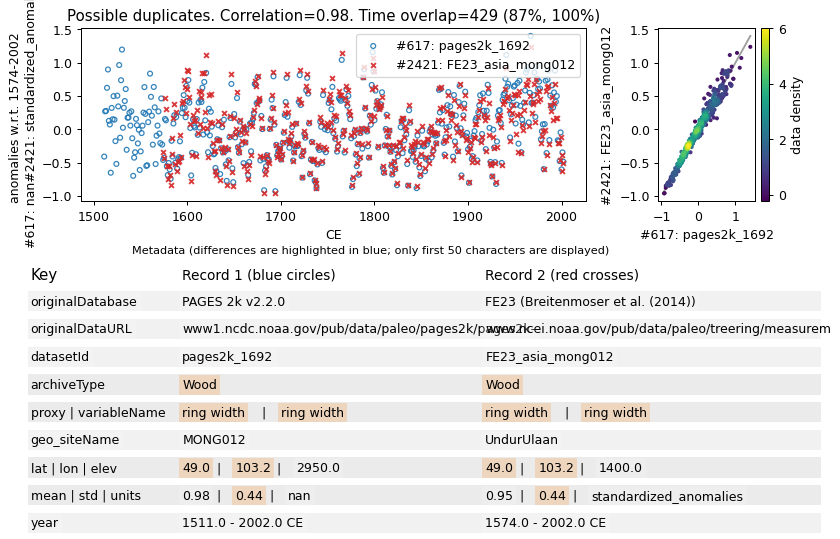

**Decision required for this duplicate pair (see figure above).**


135/429: **DECISION** Keep record 1 (pages2k_1692, blue circles) [1], record 2 (FE23_asia_mong012, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/134_pages2k_1692_FE23_asia_mong012__617_2421.jpg
KEEP RED CROSSES: remove pages2k_1692, keep FE23_asia_mong012.
write decision to backup file
619 4204 98 135
> 136/429,pages2k_1703,ch2k_MO06PED01_226,0.1809429642245807,1.0
=== POTENTIAL DUPLICATE 135/429: pages2k_1703+ch2k_MO06PED01_226 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-PedradeLume-CapeVerdeIslands.Moses.2006.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/6184   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_1703, 

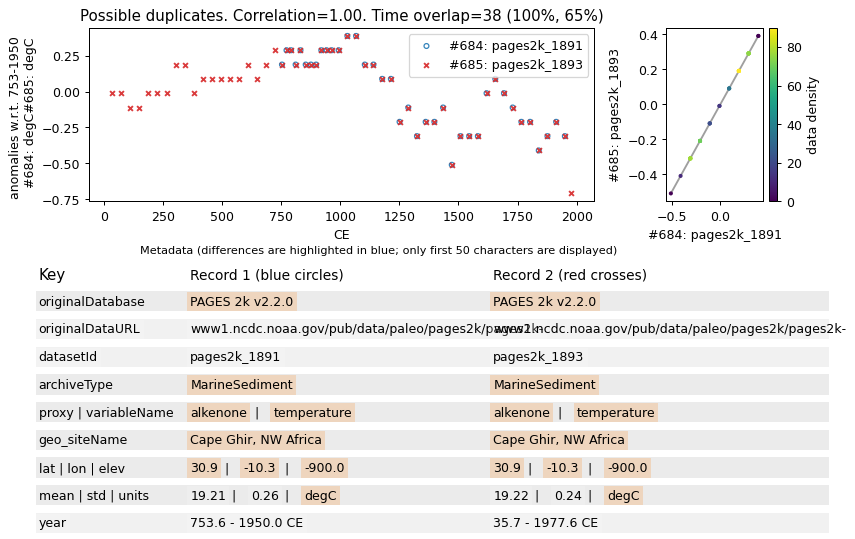

**Decision required for this duplicate pair (see figure above).**


149/429: **DECISION** Keep record 1 (pages2k_1891, blue circles) [1], record 2 (pages2k_1893, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/148_pages2k_1891_pages2k_1893__684_685.jpg
KEEP RED CROSSES: remove pages2k_1891, keep pages2k_1893.
write decision to backup file
695 4365 98 149
> 150/429,pages2k_1918,iso2k_102,0.0,1.0
=== POTENTIAL DUPLICATE 149/429: pages2k_1918+iso2k_102 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ant-SipleStation.Mosley-Thompson.1990.txt   ===
=== URL 2: www.ncdc.noaa.gov/paleo-search/study/27330   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_1918, keep iso2k_102.
write decision to backup file
696 6

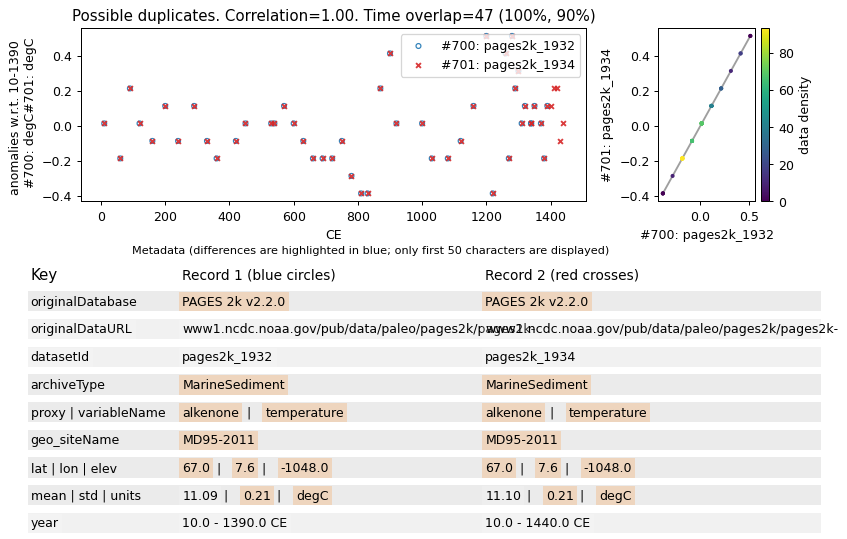

**Decision required for this duplicate pair (see figure above).**


152/429: **DECISION** Keep record 1 (pages2k_1932, blue circles) [1], record 2 (pages2k_1934, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/151_pages2k_1932_pages2k_1934__700_701.jpg
KEEP RED CROSSES: remove pages2k_1932, keep pages2k_1934.
write decision to backup file
705 4128 98 152
> 153/429,pages2k_1942,ch2k_ZI04IFR01_26,0.0,1.0
=== POTENTIAL DUPLICATE 152/429: pages2k_1942+ch2k_ZI04IFR01_26 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Ifaty4.Zinke.2004.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/1897   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  True
RECORDS IDENTICAL (perfect correlation) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_1942, keep ch2k_ZI04IFR01_26.
write decision to ba

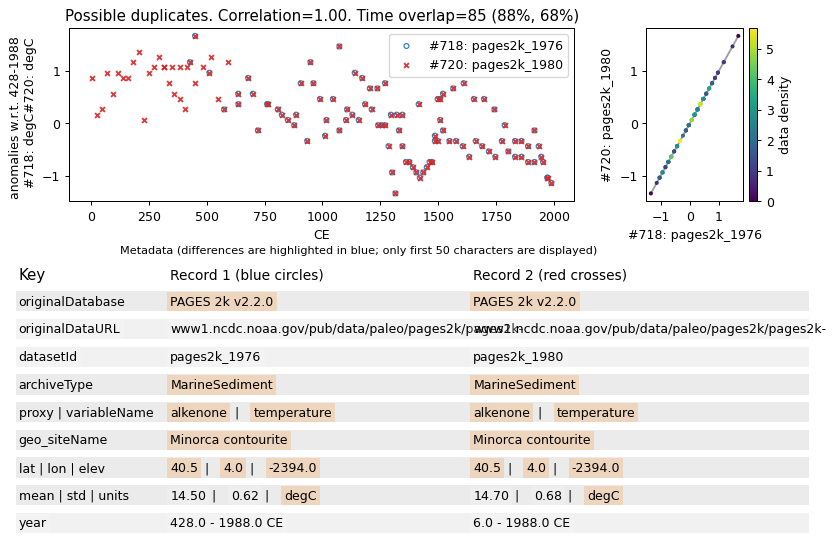

**Decision required for this duplicate pair (see figure above).**


156/429: **DECISION** Keep record 1 (pages2k_1976, blue circles) [1], record 2 (pages2k_1980, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/155_pages2k_1976_pages2k_1980__718_720.jpg
KEEP RED CROSSES: remove pages2k_1976, keep pages2k_1980.
write decision to backup file
719 721 98 156
> 157/429,pages2k_1978,pages2k_1983,0.0,1.0
=== POTENTIAL DUPLICATE 156/429: pages2k_1978+pages2k_1983 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-MinorcaContourite.Moreno.2012-1.txt   ===
=== URL 2: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-MinorcaContourite.Moreno.2012-2.txt   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  False
correlation_perfect:  False


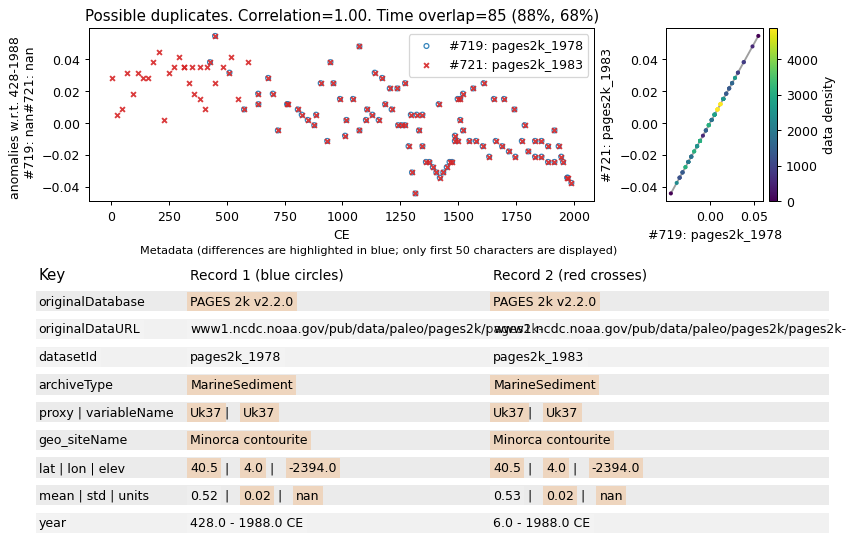

**Decision required for this duplicate pair (see figure above).**


157/429: **DECISION** Keep record 1 (pages2k_1978, blue circles) [1], record 2 (pages2k_1983, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/156_pages2k_1978_pages2k_1983__719_721.jpg
KEEP RED CROSSES: remove pages2k_1978, keep pages2k_1983.
write decision to backup file
722 4622 98 157
> 158/429,pages2k_1985,iso2k_1294,0.022267136932497017,1.0
=== POTENTIAL DUPLICATE 157/429: pages2k_1985+iso2k_1294 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Arc-NGTB16.Schwager.1998.txt   ===
=== URL 2: https://doi.pangaea.de/10.1594/PANGAEA.849161   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_1985, keep iso2k_1294.
write decision to backup

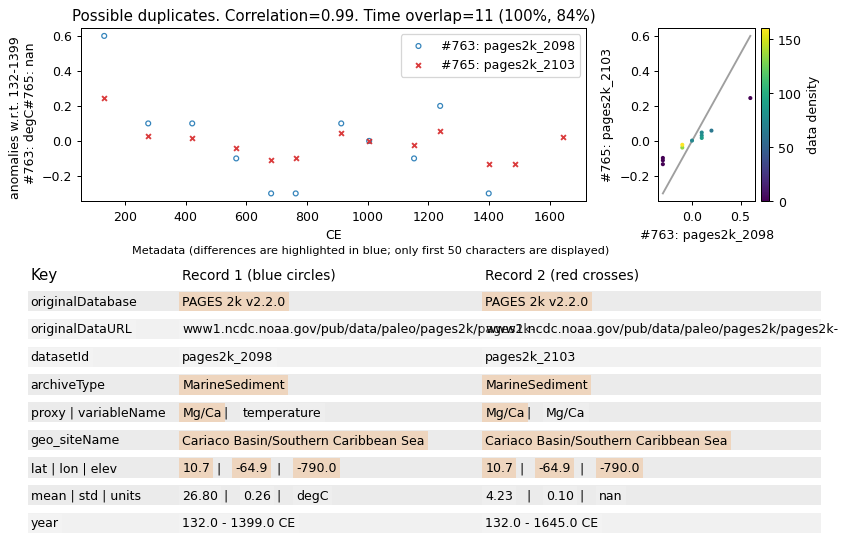

**Decision required for this duplicate pair (see figure above).**


168/429: **DECISION** Keep record 1 (pages2k_2098, blue circles) [1], record 2 (pages2k_2103, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: b


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/167_pages2k_2098_pages2k_2103__763_765.jpg
KEEP BOTH: keep pages2k_2098, keep pages2k_2103.
write decision to backup file
768 3276 98 168
> 169/429,pages2k_2110,FE23_northamerica_usa_co554,3.978640208073092,0.9663565642909764
=== POTENTIAL DUPLICATE 168/429: pages2k_2110+FE23_northamerica_usa_co554 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/NAm-CottonwoodPass.Briffa.1996-1.txt   ===
=== URL 2: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/usa/co554-noaa.rwl   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False False
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False
Automated choice. Metadata identical, automatically choose FE23

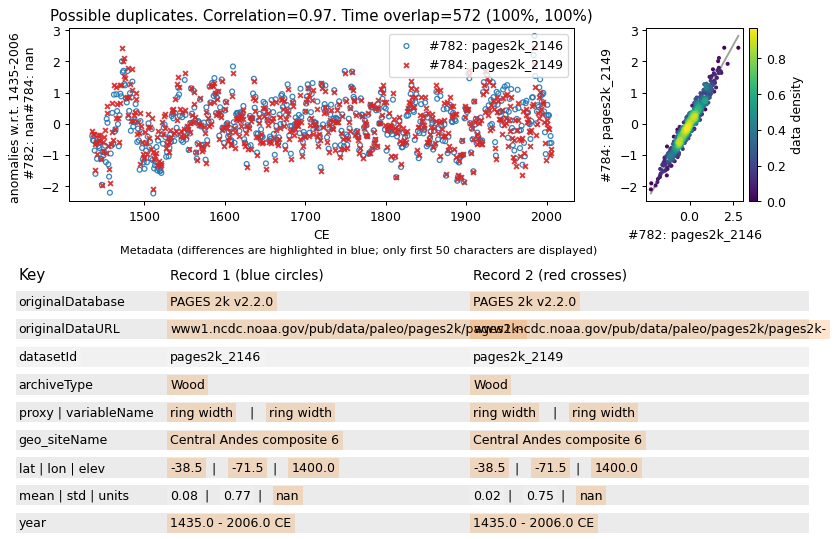

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
............................................................
     - Dataset ID          : pages2k_2150
     - URL                 : https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/SAm-CentralAndes6.Villalba.2014.txt


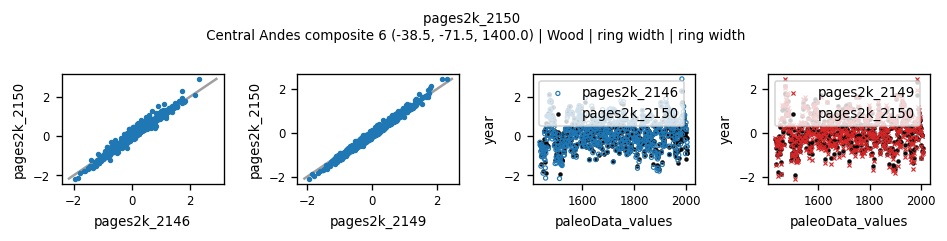

---------------------------------------------------------------------------------------------------------


170/429: **DECISION** Keep record 1 (pages2k_2146, blue circles) [1], record 2 (pages2k_2149, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: b


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/169_pages2k_2146_pages2k_2149__782_784.jpg
KEEP BOTH: keep pages2k_2146, keep pages2k_2149.
write decision to backup file
782 785 98 170
> 171/429,pages2k_2146,pages2k_2150,0.0,0.9832956643776358
=== POTENTIAL DUPLICATE 170/429: pages2k_2146+pages2k_2150 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/SAm-CentralAndes6.Villalba.2014.txt   ===
=== URL 2: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/SAm-CentralAndes6.Villalba.2014.txt   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  True
data_identical:  False
correlation_perfect:  True
RECORDS IDENTICAL (perfect correlation). Automatically choose #1.
KEEP BLUE 

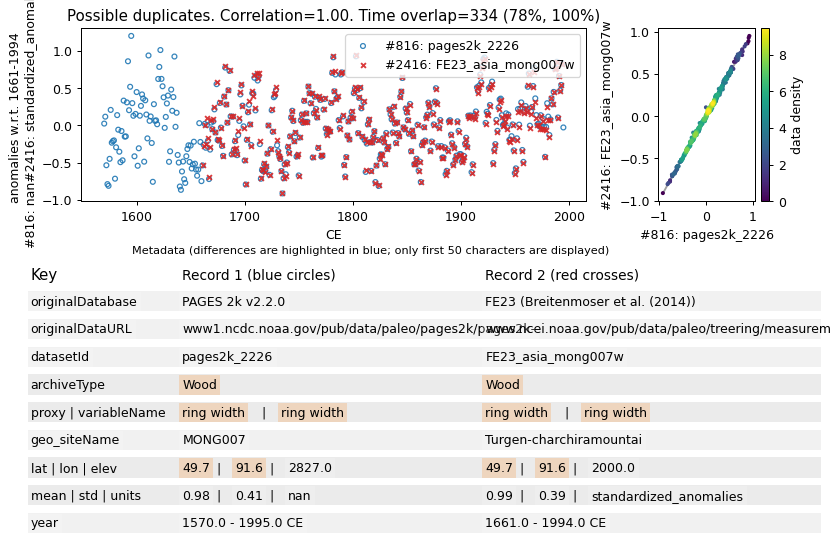

**Decision required for this duplicate pair (see figure above).**


176/429: **DECISION** Keep record 1 (pages2k_2226, blue circles) [1], record 2 (FE23_asia_mong007w, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/175_pages2k_2226_FE23_asia_mong007w__816_2416.jpg
KEEP BLUE CIRCLES: keep pages2k_2226, remove FE23_asia_mong007w.
write decision to backup file
833 2833 98 176
> 177/429,pages2k_2265,FE23_northamerica_usa_ak070,2.0092840563554346,0.9637690332839383
=== POTENTIAL DUPLICATE 176/429: pages2k_2265+FE23_northamerica_usa_ak070 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/NAm-WindyRidgeAlaska.DArrigo.2005.txt   ===
=== URL 2: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/usa/ak070-noaa.rwl   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False False
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False
Automated choice. Metadata identical, 

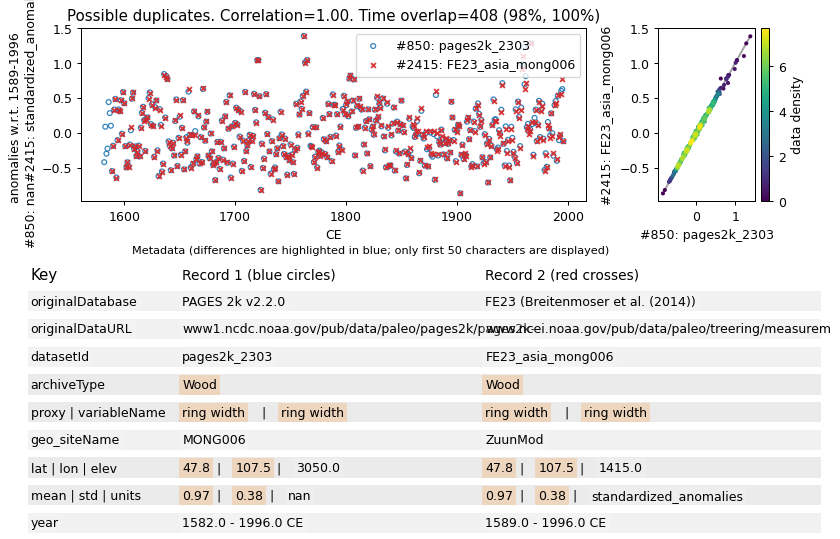

**Decision required for this duplicate pair (see figure above).**


180/429: **DECISION** Keep record 1 (pages2k_2303, blue circles) [1], record 2 (FE23_asia_mong006, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/179_pages2k_2303_FE23_asia_mong006__850_2415.jpg
KEEP BLUE CIRCLES: keep pages2k_2303, remove FE23_asia_mong006.
write decision to backup file
853 4197 98 180
> 181/429,pages2k_2309,ch2k_WE09ARR01_208,0.5077625559620448,0.9999999999999999
=== POTENTIAL DUPLICATE 180/429: pages2k_2309+ch2k_WE09ARR01_208 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-GBR.Wei.2009.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/10425   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_2309, keep ch2k_

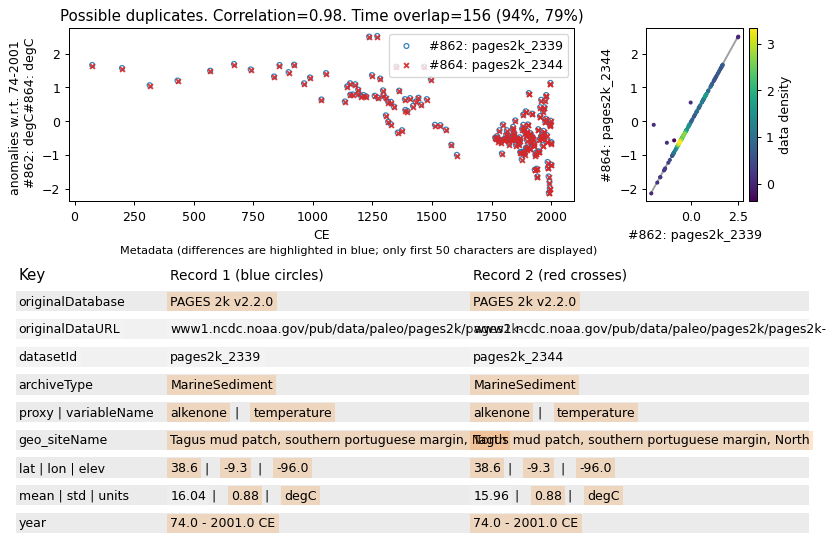

**Decision required for this duplicate pair (see figure above).**


184/429: **DECISION** Keep record 1 (pages2k_2339, blue circles) [1], record 2 (pages2k_2344, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/183_pages2k_2339_pages2k_2344__862_864.jpg
KEEP RED CROSSES: remove pages2k_2339, keep pages2k_2344.
write decision to backup file
870 4046 98 184
> 185/429,pages2k_2361,FE23_northamerica_usa_wa097,3.727634529190587,0.9933066574854877
=== POTENTIAL DUPLICATE 184/429: pages2k_2361+FE23_northamerica_usa_wa097 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/NAm-HohLakeHigh.Peterson.1994.txt   ===
=== URL 2: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/usa/wa097-noaa.rwl   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False
Automated choice. Metadata identical, automatically choose

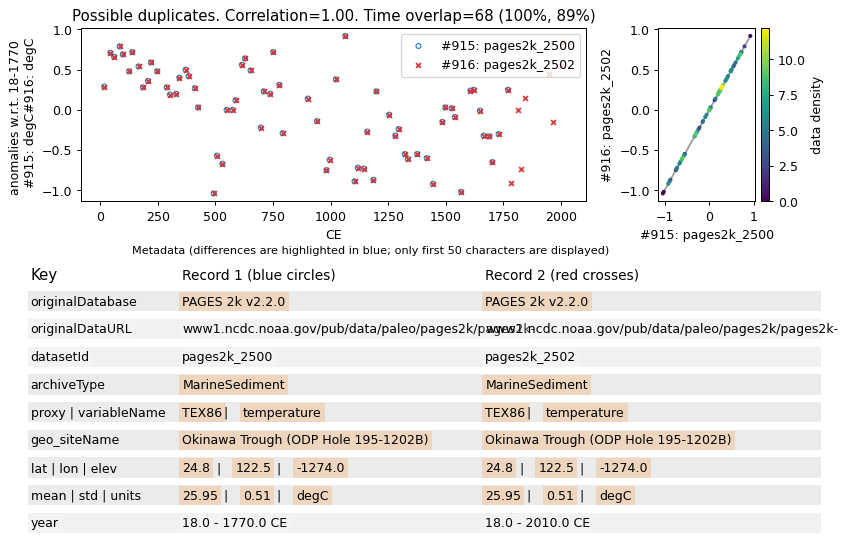

**Decision required for this duplicate pair (see figure above).**


189/429: **DECISION** Keep record 1 (pages2k_2500, blue circles) [1], record 2 (pages2k_2502, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/188_pages2k_2500_pages2k_2502__915_916.jpg
KEEP RED CROSSES: remove pages2k_2500, keep pages2k_2502.
write decision to backup file
920 4690 98 189
> 190/429,pages2k_2510,iso2k_1626,0.0,1.0
=== POTENTIAL DUPLICATE 189/429: pages2k_2510+iso2k_1626 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Arc-Renland.Vinther.2008.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/11148   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_2510, keep iso2k_1626.
write decision to backup file
922 4652 98 19

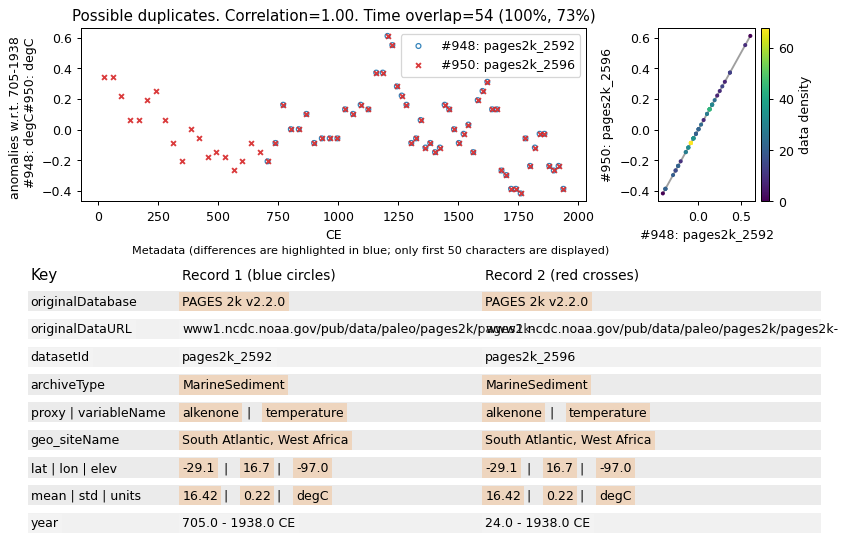

**Decision required for this duplicate pair (see figure above).**


196/429: **DECISION** Keep record 1 (pages2k_2592, blue circles) [1], record 2 (pages2k_2596, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/195_pages2k_2592_pages2k_2596__948_950.jpg
KEEP RED CROSSES: remove pages2k_2592, keep pages2k_2596.
write decision to backup file
949 951 98 196
> 197/429,pages2k_2595,pages2k_2599,0.0,1.0
=== POTENTIAL DUPLICATE 196/429: pages2k_2595+pages2k_2599 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-SouthAtlanticWestAfrica.Leduc.2010-1.txt   ===
=== URL 2: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-SouthAtlanticWestAfrica.Leduc.2010-2.txt   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  False
correlation_perfect:  False


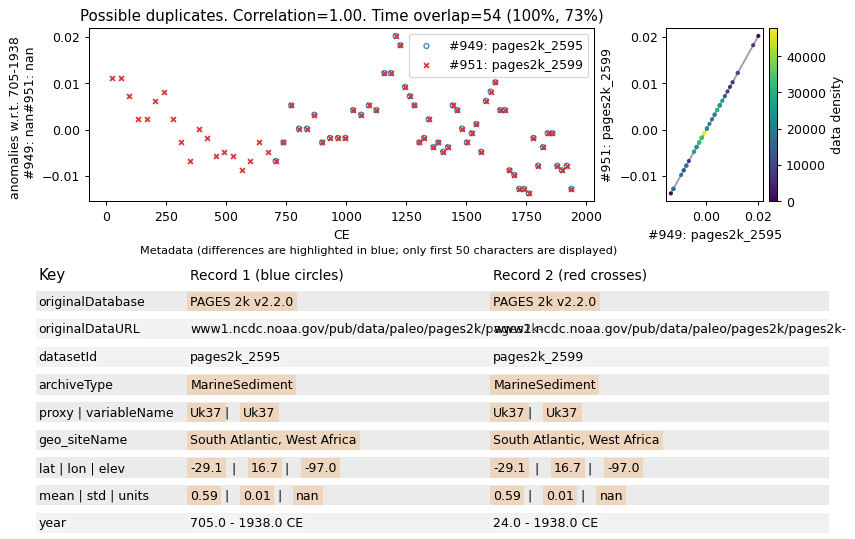

**Decision required for this duplicate pair (see figure above).**


197/429: **DECISION** Keep record 1 (pages2k_2595, blue circles) [1], record 2 (pages2k_2599, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/196_pages2k_2595_pages2k_2599__949_951.jpg
KEEP RED CROSSES: remove pages2k_2595, keep pages2k_2599.
write decision to backup file
954 955 98 197
> 198/429,pages2k_2604,pages2k_2606,0.0,0.9999999999998915
=== POTENTIAL DUPLICATE 197/429: pages2k_2604+pages2k_2606 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Arc-Lomonosovfonna.Divine.2011.txt   ===
=== URL 2: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Arc-Lomonosovfonna.Divine.2011.txt   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  True
data_identical:  False
correlation_perfect:  True
RECORDS IDENTICAL (perfect correlation). Automatically choose #1.
KEE

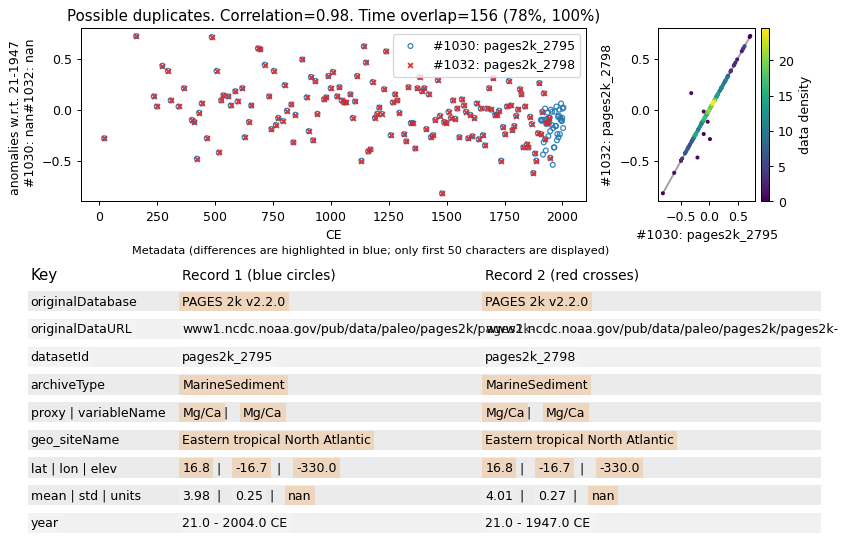

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  pages2k_2793
---------------------------------------------------------------------------------------------------------


216/429: **DECISION** Keep record 1 (pages2k_2795, blue circles) [1], record 2 (pages2k_2798, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: b


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/215_pages2k_2795_pages2k_2798__1030_1032.jpg
KEEP BOTH: keep pages2k_2795, keep pages2k_2798.
write decision to backup file
1031 1032 98 216
> 217/429,pages2k_2796,pages2k_2798,0.0,0.9982162224217608
=== POTENTIAL DUPLICATE 216/429: pages2k_2796+pages2k_2798 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-EasternTropicalNorthAtlantic.Kuhnert.2011-2.txt   ===
=== URL 2: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-EasternTropicalNorthAtlantic.Kuhnert.2011-2.txt   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  True
data_identical:  False
correlation_perfect:  True
RECORDS IDENTICAL (perfect correlation).

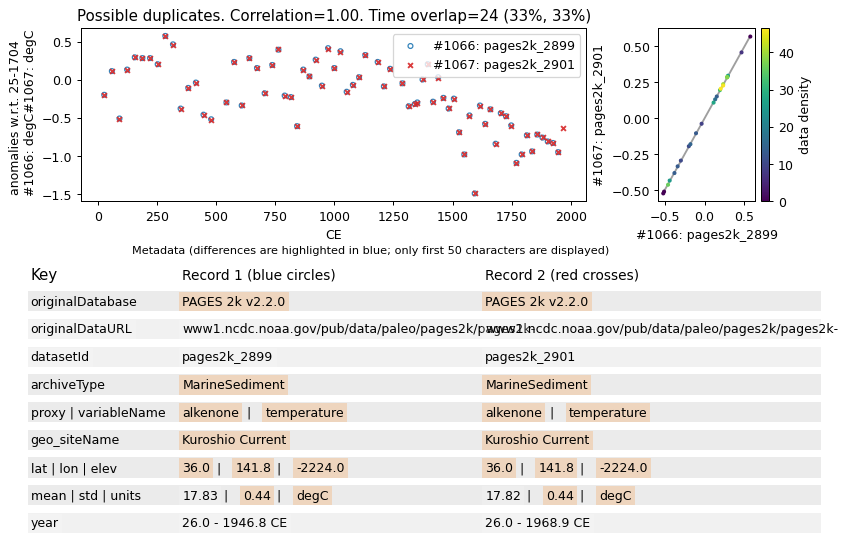

**Decision required for this duplicate pair (see figure above).**


220/429: **DECISION** Keep record 1 (pages2k_2899, blue circles) [1], record 2 (pages2k_2901, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/219_pages2k_2899_pages2k_2901__1066_1067.jpg
KEEP RED CROSSES: remove pages2k_2899, keep pages2k_2901.
write decision to backup file
1068 1069 98 220
> 221/429,pages2k_2904,pages2k_2906,0.0,0.9975794070998795
=== POTENTIAL DUPLICATE 220/429: pages2k_2904+pages2k_2906 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-NorthwestPacificOcean.Harada.2004-1.txt   ===
=== URL 2: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-NorthwestPacificOcean.Harada.2004-2.txt   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  False
correlation_perfect:  False


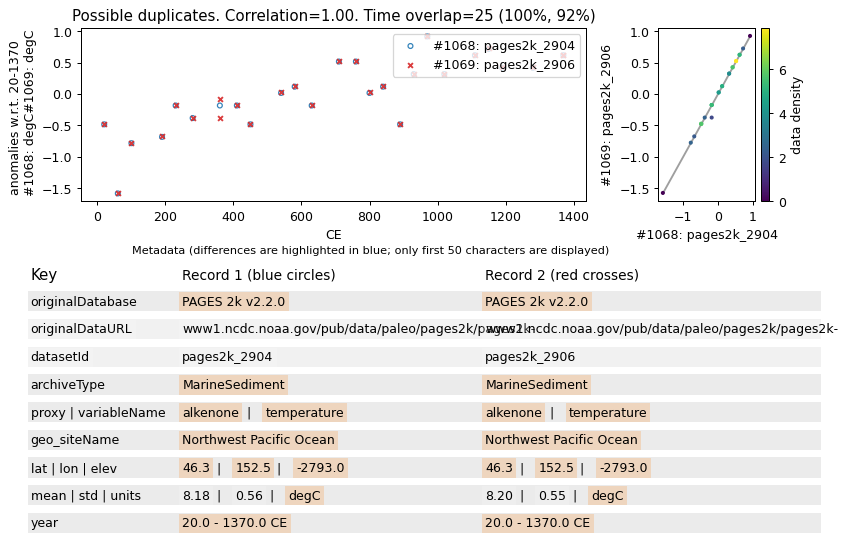

**Decision required for this duplicate pair (see figure above).**


221/429: **DECISION** Keep record 1 (pages2k_2904, blue circles) [1], record 2 (pages2k_2906, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/220_pages2k_2904_pages2k_2906__1068_1069.jpg
KEEP BLUE CIRCLES: keep pages2k_2904, remove pages2k_2906.
write decision to backup file
1075 3151 98 221
> 222/429,pages2k_2922,FE23_northamerica_usa_ca603,3.4621315803107966,0.957962036670777
=== POTENTIAL DUPLICATE 221/429: pages2k_2922+FE23_northamerica_usa_ca603 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/NAm-DanaPlateauInyoNationalForest.King.2000.txt   ===
=== URL 2: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/usa/ca603-noaa.rwl   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False False
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False
Automated choice. Metadata identical, a

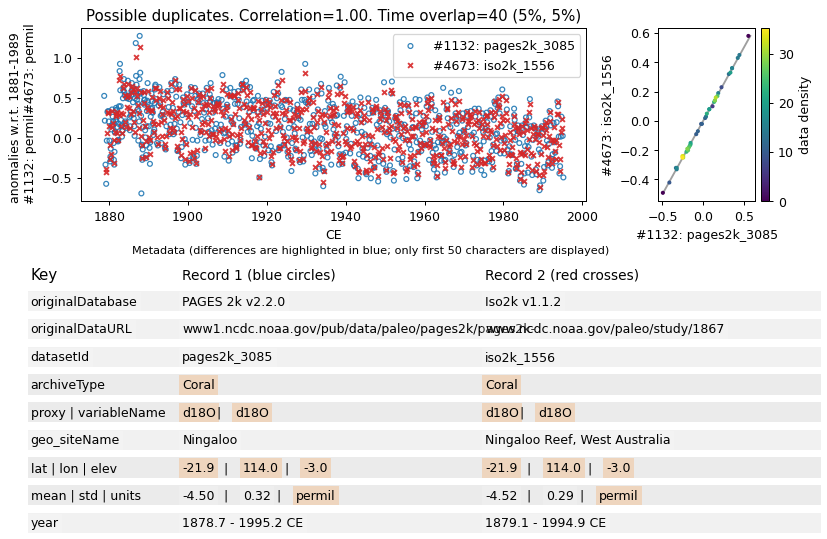

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
............................................................
     - Dataset ID          : ch2k_KU00NIN01_150
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/1867


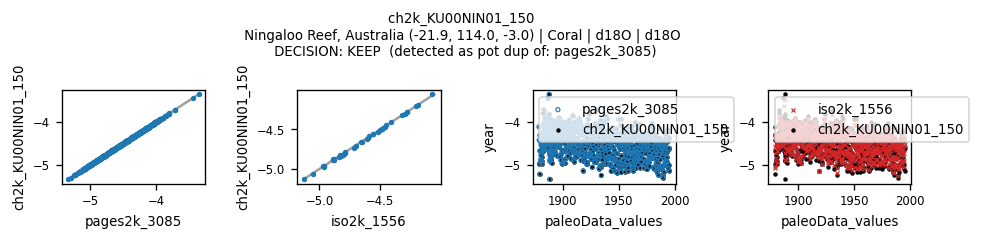

............................................................
     - Dataset ID          : iso2k_1554
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/1867


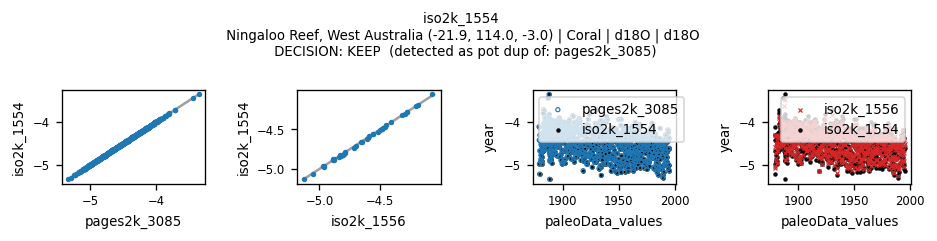

---------------------------------------------------------------------------------------------------------


236/429: **DECISION** Keep record 1 (pages2k_3085, blue circles) [1], record 2 (iso2k_1556, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/235_pages2k_3085_iso2k_1556__1132_4673.jpg
KEEP RED CROSSES: remove pages2k_3085, keep iso2k_1556.
write decision to backup file
1140 3274 98 236
> 237/429,pages2k_3107,FE23_northamerica_usa_co552,1.4626835452261282,0.9441889459422474
=== POTENTIAL DUPLICATE 236/429: pages2k_3107+FE23_northamerica_usa_co552 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/NAm-RedMountainPassSilverton.Graybill.1994-1.txt   ===
=== URL 2: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/usa/co552-noaa.rwl   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False False
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False
Automated choice. Metadata identical, auto

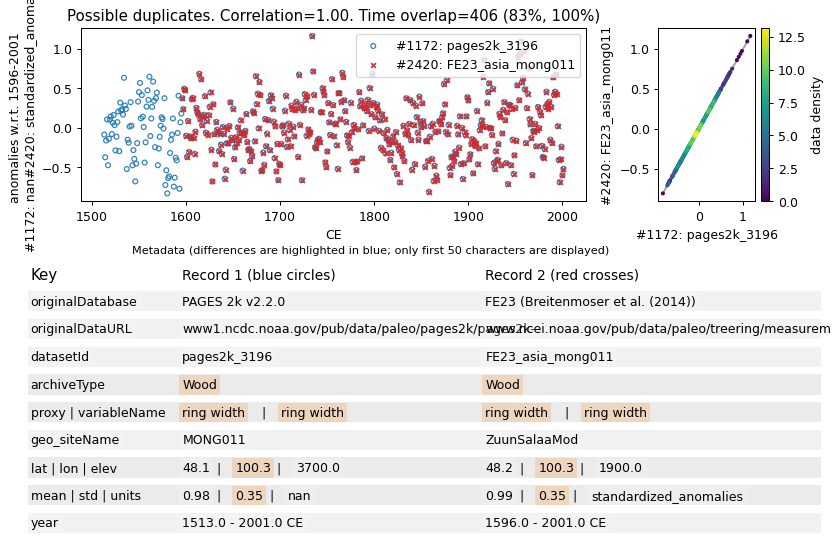

**Decision required for this duplicate pair (see figure above).**


245/429: **DECISION** Keep record 1 (pages2k_3196, blue circles) [1], record 2 (FE23_asia_mong011, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/244_pages2k_3196_FE23_asia_mong011__1172_2420.jpg
KEEP BLUE CIRCLES: keep pages2k_3196, remove FE23_asia_mong011.
write decision to backup file
1175 4712 98 245
> 246/429,pages2k_3202,iso2k_1727,0.0,0.9999999999999999
=== POTENTIAL DUPLICATE 245/429: pages2k_3202+iso2k_1727 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Arc-DevonIceCap.Fisher.1983.txt   ===
=== URL 2: https://www1.ncdc.noaa.gov/pub/data/paleo/icecore/polar/devon/d7273del_5yr.txt   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_

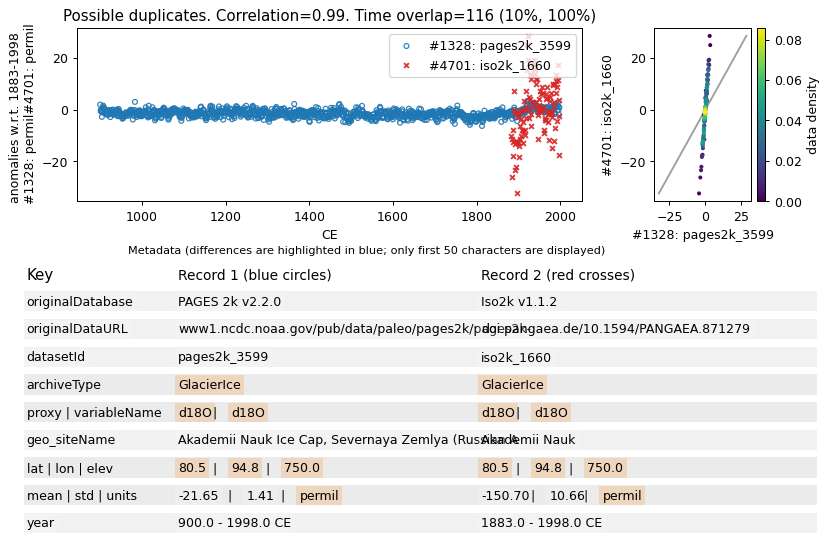

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
............................................................
     - Dataset ID          : iso2k_1069
     - URL                 : https://doi.pangaea.de/10.1594/PANGAEA.824732


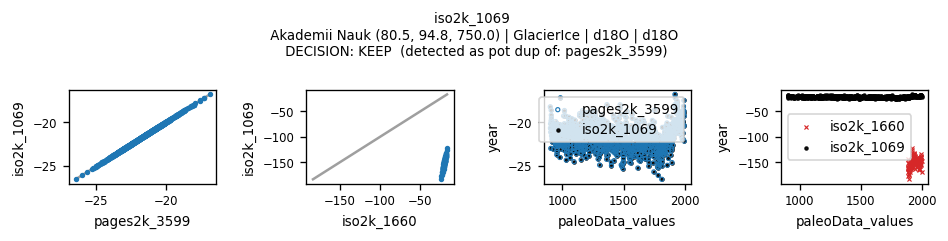

---------------------------------------------------------------------------------------------------------


274/429: **DECISION** Keep record 1 (pages2k_3599, blue circles) [1], record 2 (iso2k_1660, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/273_pages2k_3599_iso2k_1660__1328_4701.jpg
KEEP RED CROSSES: remove pages2k_3599, keep iso2k_1660.
write decision to backup file
1333 1549 98 274
> 275/429,pages2k_3609,FE23_northamerica_canada_cana053,2.515139756800339,0.9046940174678464
=== POTENTIAL DUPLICATE 274/429: pages2k_3609+FE23_northamerica_canada_cana053 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/NAm-PethaiPeninsula.Schweingruber.1996-1.txt   ===
=== URL 2: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/canada/cana053-noaa.rwl   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False False
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False
Automated choice. Metadata ident

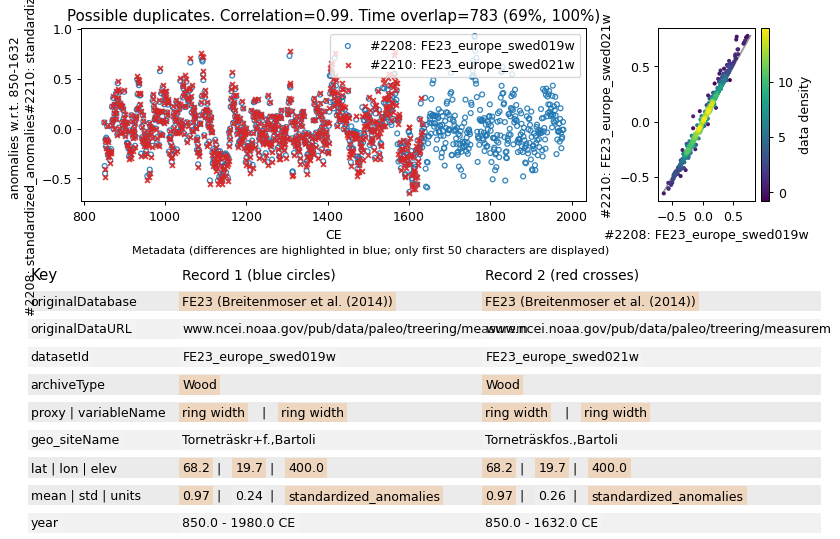

**Decision required for this duplicate pair (see figure above).**


284/429: **DECISION** Keep record 1 (FE23_europe_swed019w, blue circles) [1], record 2 (FE23_europe_swed021w, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/283_FE23_europe_swed019w_FE23_europe_swed021w__2208_2210.jpg
KEEP BLUE CIRCLES: keep FE23_europe_swed019w, remove FE23_europe_swed021w.
write decision to backup file
2388 2389 98 284
> 285/429,FE23_northamerica_mexico_mexi022,FE23_northamerica_mexico_mexi023,0.0,0.9705431503944612
=== POTENTIAL DUPLICATE 284/429: FE23_northamerica_mexico_mexi022+FE23_northamerica_mexico_mexi023 ===
=== URL 1: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/mexico/mexi022-noaa.rwl   ===
=== URL 2: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/mexico/mexi023-noaa.rwl   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False False
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False


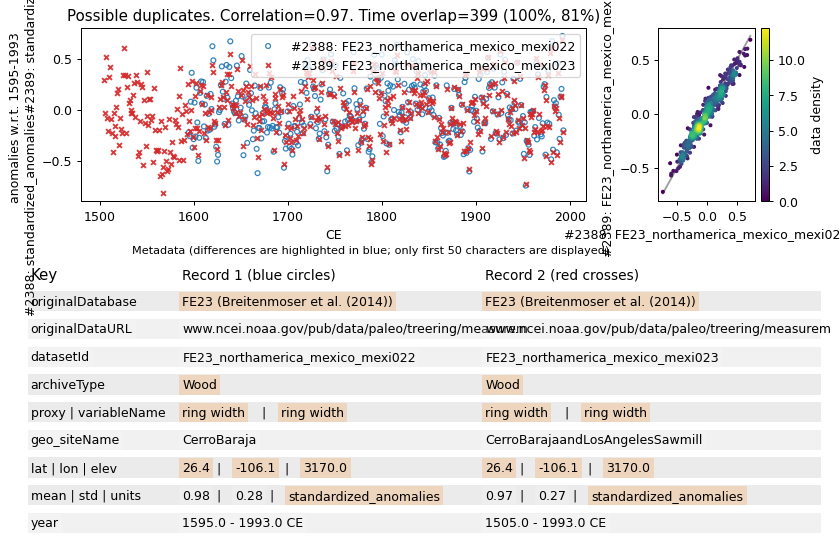

**Decision required for this duplicate pair (see figure above).**


285/429: **DECISION** Keep record 1 (FE23_northamerica_mexico_mexi022, blue circles) [1], record 2 (FE23_northamerica_mexico_mexi023, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/284_FE23_northamerica_mexico_mexi022_FE23_northamerica_mexico_mexi023__2388_2389.jpg
KEEP RED CROSSES: remove FE23_northamerica_mexico_mexi022, keep FE23_northamerica_mexico_mexi023.
write decision to backup file
2469 2522 98 285
> 286/429,FE23_australia_newz003,FE23_australia_newz060,0.0,0.9820284222987329
=== POTENTIAL DUPLICATE 285/429: FE23_australia_newz003+FE23_australia_newz060 ===
=== URL 1: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/australia/newz003-noaa.rwl   ===
=== URL 2: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/australia/newz060-noaa.rwl   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False
Record 2 (FE23_australia_

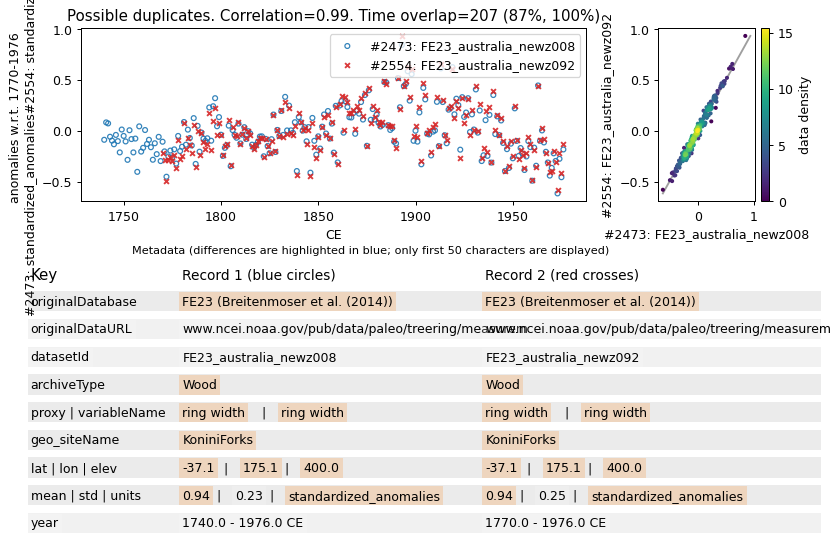

**Decision required for this duplicate pair (see figure above).**


287/429: **DECISION** Keep record 1 (FE23_australia_newz008, blue circles) [1], record 2 (FE23_australia_newz092, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/286_FE23_australia_newz008_FE23_australia_newz092__2473_2554.jpg
KEEP BLUE CIRCLES: keep FE23_australia_newz008, remove FE23_australia_newz092.
write decision to backup file
2477 2523 98 287
> 288/429,FE23_australia_newz014,FE23_australia_newz061,0.0,0.9830309576791556
=== POTENTIAL DUPLICATE 287/429: FE23_australia_newz014+FE23_australia_newz061 ===
=== URL 1: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/australia/newz014-noaa.rwl   ===
=== URL 2: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/australia/newz061-noaa.rwl   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False
Record 2 (FE23_australia_newz061) is UPDATE of record 1 (FE23_au

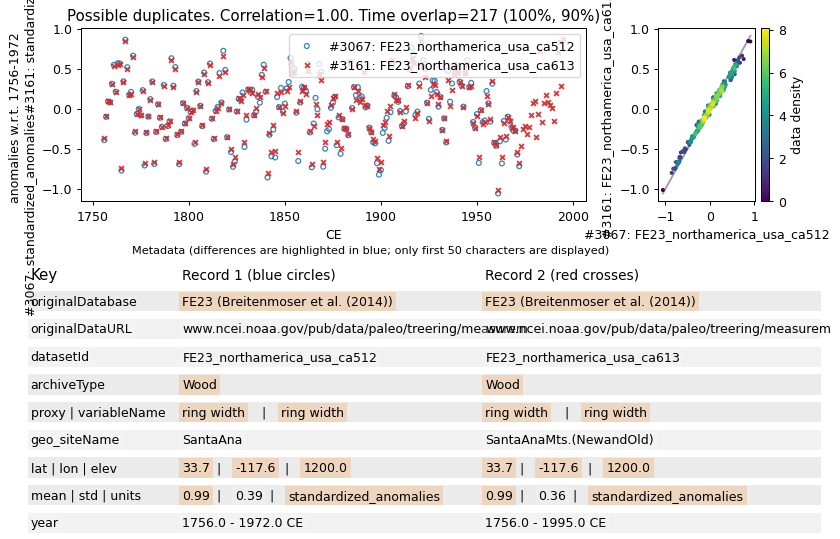

**Decision required for this duplicate pair (see figure above).**


293/429: **DECISION** Keep record 1 (FE23_northamerica_usa_ca512, blue circles) [1], record 2 (FE23_northamerica_usa_ca613, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/292_FE23_northamerica_usa_ca512_FE23_northamerica_usa_ca613__3067_3161.jpg
KEEP RED CROSSES: remove FE23_northamerica_usa_ca512, keep FE23_northamerica_usa_ca613.
write decision to backup file
3084 3216 98 293
> 294/429,FE23_northamerica_usa_ca535,FE23_northamerica_usa_ca670,5.5596693510930715,0.9783723385582629
=== POTENTIAL DUPLICATE 293/429: FE23_northamerica_usa_ca535+FE23_northamerica_usa_ca670 ===
=== URL 1: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/usa/ca535-noaa.rwl   ===
=== URL 2: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/usa/ca670-noaa.rwl   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False False
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False

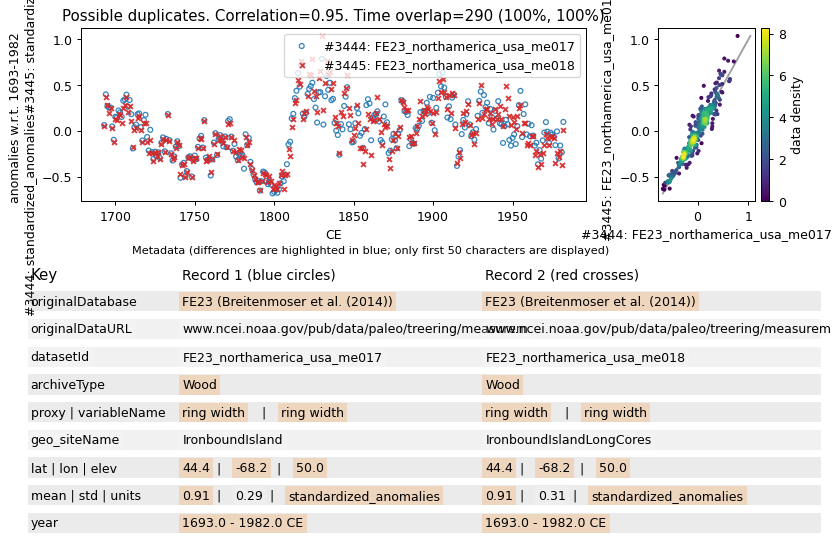

**Decision required for this duplicate pair (see figure above).**


295/429: **DECISION** Keep record 1 (FE23_northamerica_usa_me017, blue circles) [1], record 2 (FE23_northamerica_usa_me018, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: c


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/294_FE23_northamerica_usa_me017_FE23_northamerica_usa_me018__3444_3445.jpg
CREATE A COMPOSITE OF BOTH RECORDS: FE23_northamerica_usa_me017, FE23_northamerica_usa_me018.
write decision to backup file
3499 3508 98 295
> 296/429,FE23_northamerica_usa_mo,FE23_northamerica_usa_mo009,0.0,0.9984885968506374
=== POTENTIAL DUPLICATE 295/429: FE23_northamerica_usa_mo+FE23_northamerica_usa_mo009 ===
=== URL 1: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/usa/mo-noaa.rwl   ===
=== URL 2: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/usa/mo009-noaa.rwl   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  False
lat True lon True elevation False archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  True
RECORDS IDENTICAL 

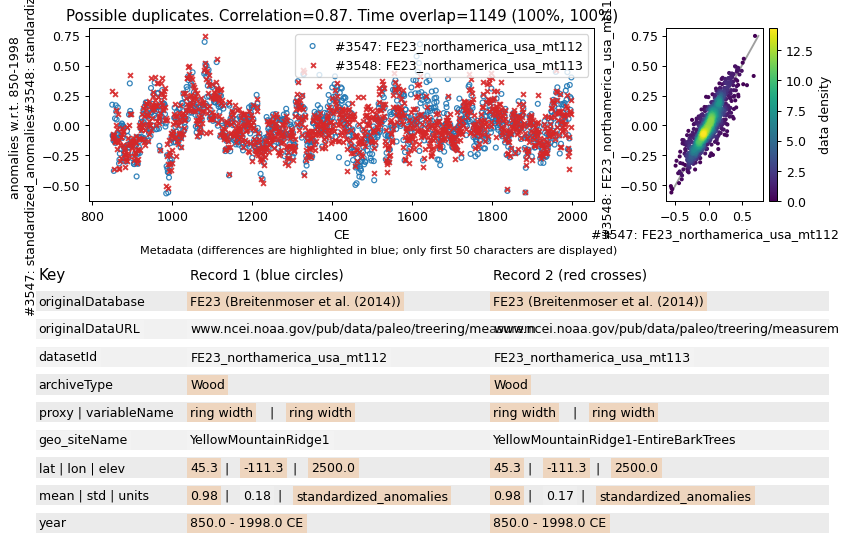

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  pages2k_1089
---------------------------------------------------------------------------------------------------------


297/429: **DECISION** Keep record 1 (FE23_northamerica_usa_mt112, blue circles) [1], record 2 (FE23_northamerica_usa_mt113, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: c


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/296_FE23_northamerica_usa_mt112_FE23_northamerica_usa_mt113__3547_3548.jpg
CREATE A COMPOSITE OF BOTH RECORDS: FE23_northamerica_usa_mt112, FE23_northamerica_usa_mt113.
write decision to backup file
3588 3589 98 297
> 298/429,FE23_northamerica_usa_nj001,FE23_northamerica_usa_nj002,0.0,0.9931763240446817
=== POTENTIAL DUPLICATE 297/429: FE23_northamerica_usa_nj001+FE23_northamerica_usa_nj002 ===
=== URL 1: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/usa/nj001-noaa.rwl   ===
=== URL 2: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/usa/nj002-noaa.rwl   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False


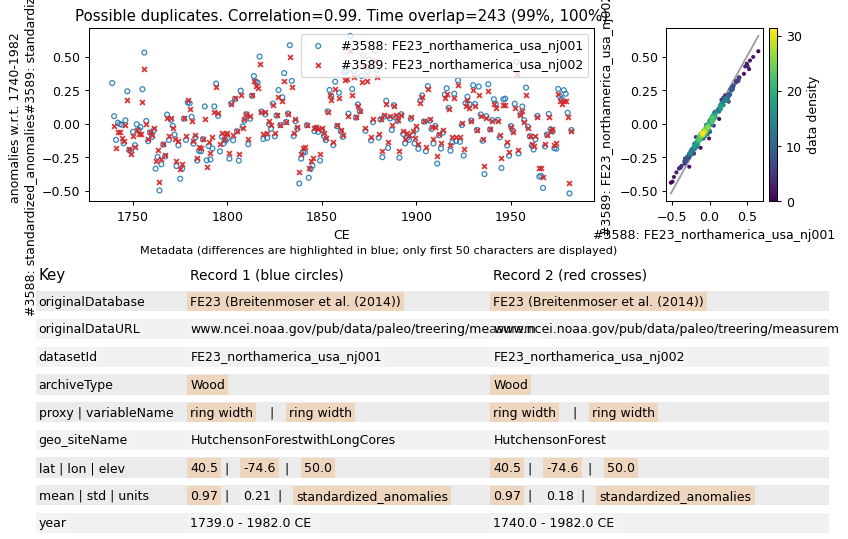

**Decision required for this duplicate pair (see figure above).**


298/429: **DECISION** Keep record 1 (FE23_northamerica_usa_nj001, blue circles) [1], record 2 (FE23_northamerica_usa_nj002, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: c


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/297_FE23_northamerica_usa_nj001_FE23_northamerica_usa_nj002__3588_3589.jpg
CREATE A COMPOSITE OF BOTH RECORDS: FE23_northamerica_usa_nj001, FE23_northamerica_usa_nj002.
write decision to backup file
3602 3628 98 298
> 299/429,FE23_northamerica_usa_nm024,FE23_northamerica_usa_nm055,0.0,0.9998373392446366
=== POTENTIAL DUPLICATE 298/429: FE23_northamerica_usa_nm024+FE23_northamerica_usa_nm055 ===
=== URL 1: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/usa/nm024-noaa.rwl   ===
=== URL 2: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/usa/nm055-noaa.rwl   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  False
correlation_perfect:  True
RECORDS IDEN

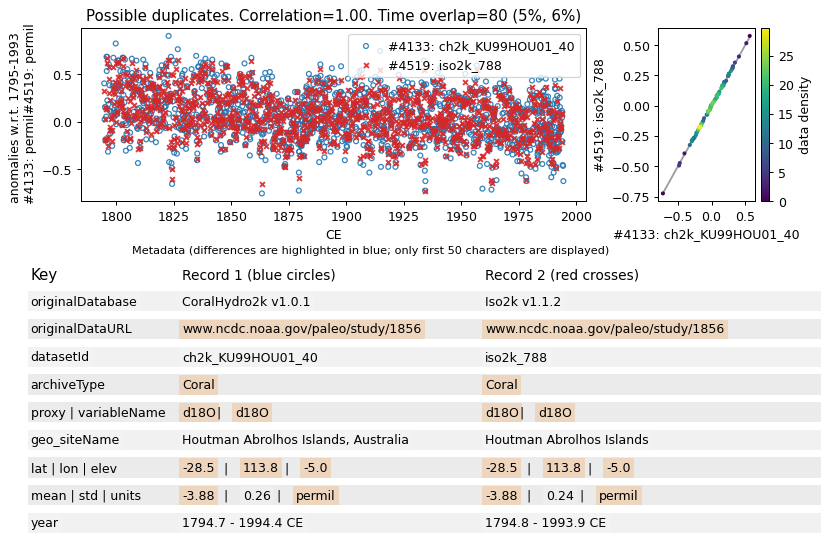

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
............................................................
     - Dataset ID          : iso2k_786
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/1856


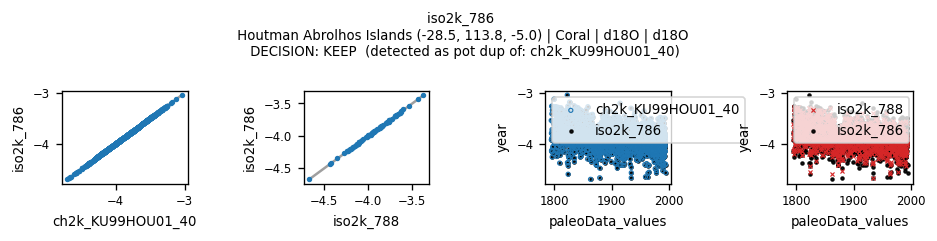

---------------------------------------------------------------------------------------------------------


314/429: **DECISION** Keep record 1 (ch2k_KU99HOU01_40, blue circles) [1], record 2 (iso2k_788, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/313_ch2k_KU99HOU01_40_iso2k_788__4133_4519.jpg
KEEP BLUE CIRCLES: keep ch2k_KU99HOU01_40, remove iso2k_788.
write decision to backup file
4138 4456 98 314
> 315/429,ch2k_NU11PAL01_52,iso2k_505,0.46978588358468626,0.9965291826467186
=== POTENTIAL DUPLICATE 314/429: ch2k_NU11PAL01_52+iso2k_505 ===
=== URL 1: https://www.ncdc.noaa.gov/paleo/study/10373   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/1875   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  False
lat True lon True elevation False archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False


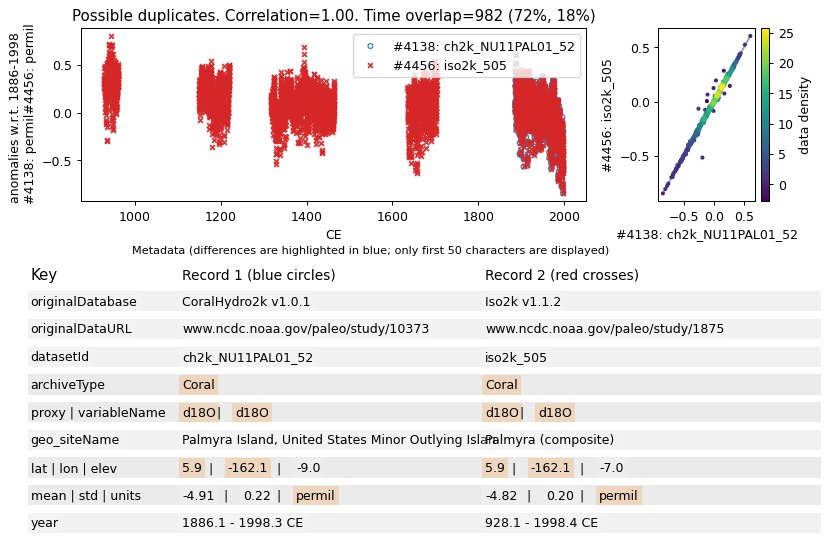

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  pages2k_1488
............................................................
     - Dataset ID          : pages2k_1628
     - URL                 : https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Palmyra.Cobb.2003.txt


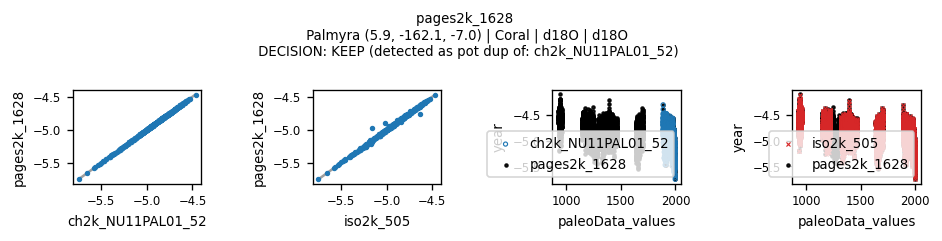

............................................................
     - Dataset ID          : iso2k_579
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10373


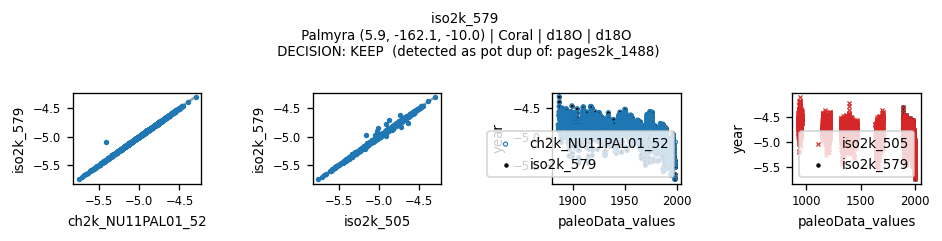

---------------------------------------------------------------------------------------------------------


315/429: **DECISION** Keep record 1 (ch2k_NU11PAL01_52, blue circles) [1], record 2 (iso2k_505, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: b


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/314_ch2k_NU11PAL01_52_iso2k_505__4138_4456.jpg
KEEP BOTH: keep ch2k_NU11PAL01_52, keep iso2k_505.
write decision to backup file
4138 4482 98 315
> 316/429,ch2k_NU11PAL01_52,iso2k_579,0.46978588358468626,0.9992710430546083
=== POTENTIAL DUPLICATE 315/429: ch2k_NU11PAL01_52+iso2k_579 ===
=== URL 1: https://www.ncdc.noaa.gov/paleo/study/10373   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/10373   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  True
data_identical:  False
correlation_perfect:  True
RECORDS IDENTICAL (perfect correlation) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove ch2k_NU11PAL01_52, keep iso2k_579.
write decision to backup file
4141 4445 98 316
> 317/429,ch2k_CA14TIM01_64,iso2

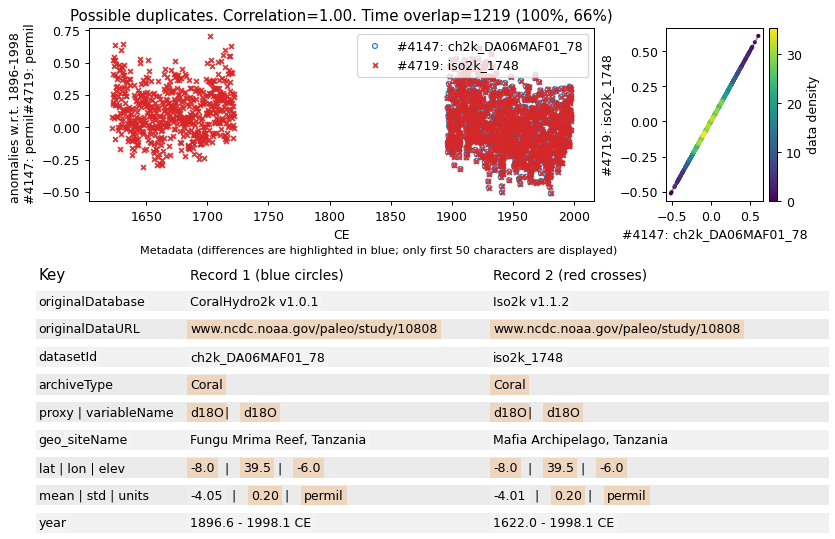

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  pages2k_1147
............................................................
     - Dataset ID          : ch2k_DA06MAF02_104
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10808


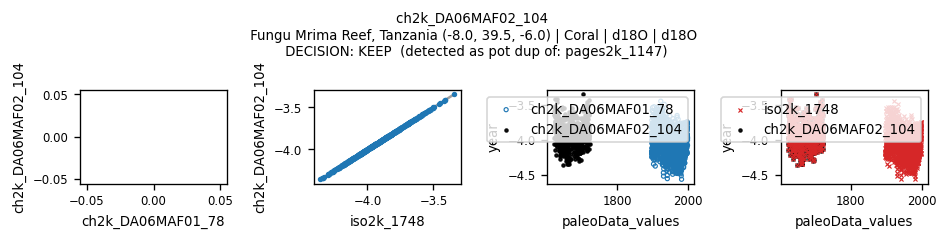

---------------------------------------------------------------------------------------------------------


319/429: **DECISION** Keep record 1 (ch2k_DA06MAF01_78, blue circles) [1], record 2 (iso2k_1748, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/318_ch2k_DA06MAF01_78_iso2k_1748__4147_4719.jpg
KEEP RED CROSSES: remove ch2k_DA06MAF01_78, keep iso2k_1748.
write decision to backup file
4148 4722 98 319
> 320/429,ch2k_NA09MAL01_84,iso2k_1754,0.0,0.9999999999999999
=== POTENTIAL DUPLICATE 319/429: ch2k_NA09MAL01_84+iso2k_1754 ===
=== URL 1: https://www.ncdc.noaa.gov/paleo/study/12994   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/12994   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  False
lat True lon True elevation False archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  True
data_identical:  False
correlation_perfect:  True
RECORDS IDENTICAL (perfect correlation) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove ch2k_NA09MAL01_84, keep iso2k_1754.
write decision to backup file
4149 4349 98 320
> 321/429,ch2k_SW98STP01_86,iso2

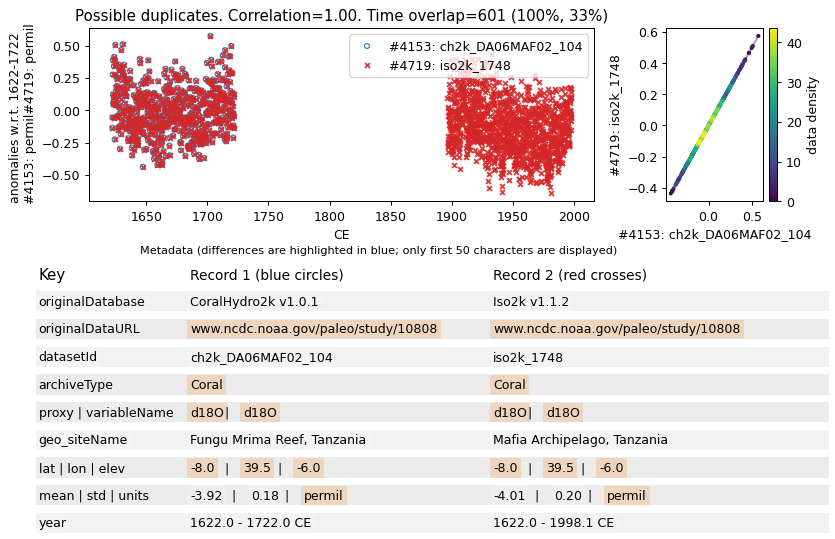

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  pages2k_1147
............................................................
     - Dataset ID          : ch2k_DA06MAF01_78
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10808


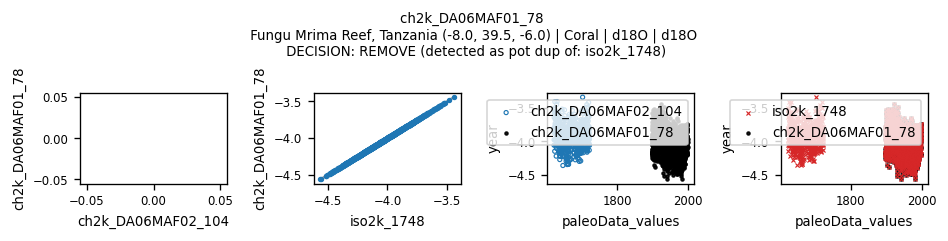

---------------------------------------------------------------------------------------------------------


322/429: **DECISION** Keep record 1 (ch2k_DA06MAF02_104, blue circles) [1], record 2 (iso2k_1748, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/321_ch2k_DA06MAF02_104_iso2k_1748__4153_4719.jpg
KEEP RED CROSSES: remove ch2k_DA06MAF02_104, keep iso2k_1748.
write decision to backup file
4156 4457 98 322
> 323/429,ch2k_CO03PAL01_110,iso2k_507,0.0,1.0
=== POTENTIAL DUPLICATE 322/429: ch2k_CO03PAL01_110+iso2k_507 ===
=== URL 1: https://www.ncdc.noaa.gov/paleo/study/1875   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/1875   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  True
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove ch2k_CO03PAL01_110, keep iso2k_507.
write decision to backup file
4159 4611 98 323
> 324/429,ch2k_CH98PIR01_116,iso2k_1229,0.0,1.0
=== POT

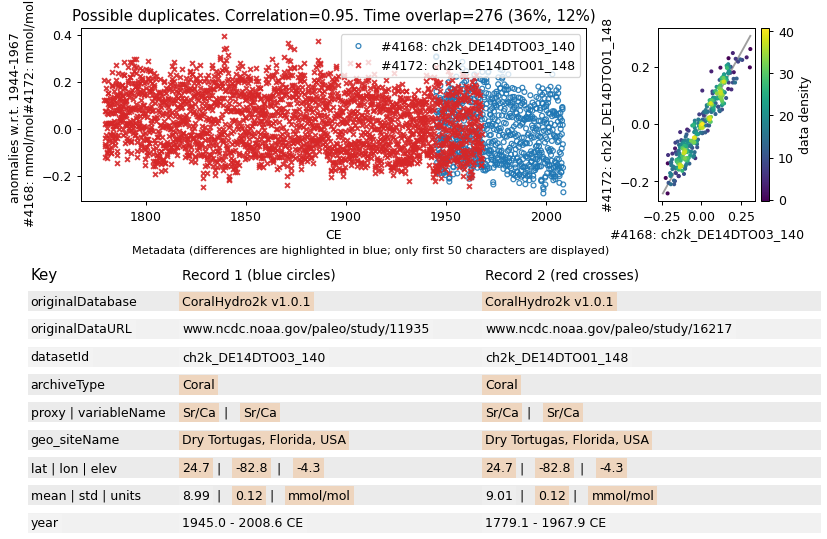

**Decision required for this duplicate pair (see figure above).**


329/429: **DECISION** Keep record 1 (ch2k_DE14DTO03_140, blue circles) [1], record 2 (ch2k_DE14DTO01_148, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: b


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/328_ch2k_DE14DTO03_140_ch2k_DE14DTO01_148__4168_4172.jpg
KEEP BOTH: keep ch2k_DE14DTO03_140, keep ch2k_DE14DTO01_148.
write decision to backup file
4170 4626 98 329
> 330/429,ch2k_QU06RAB01_144,iso2k_1311,1.3265164823623186,0.9998938624989858
=== POTENTIAL DUPLICATE 329/429: ch2k_QU06RAB01_144+iso2k_1311 ===
=== URL 1: https://www.ncdc.noaa.gov/paleo/study/6116   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/6116   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  True
data_identical:  False
correlation_perfect:  True
RECORDS IDENTICAL (perfect correlation) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove ch2k_QU06RAB01_144, keep iso2k_1311.
write decision to backup file
4173 4672 98 330
> 331/429

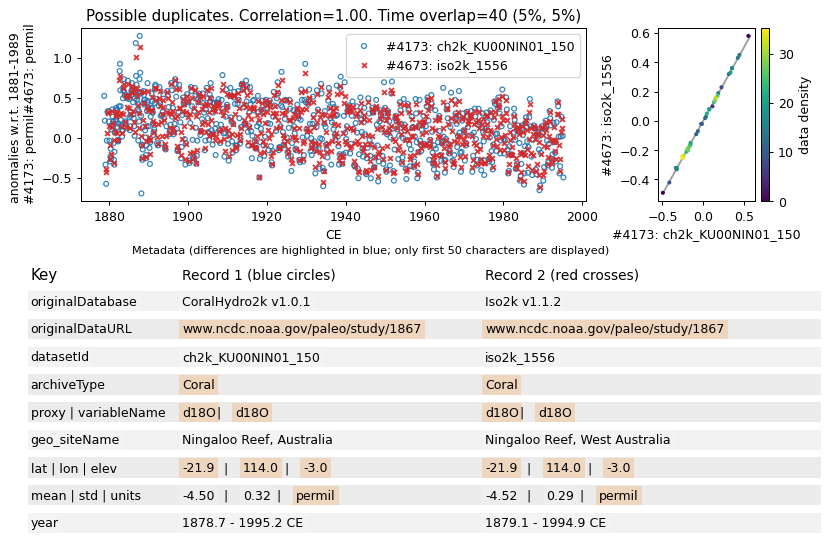

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  pages2k_3085
............................................................
     - Dataset ID          : iso2k_1554
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/1867


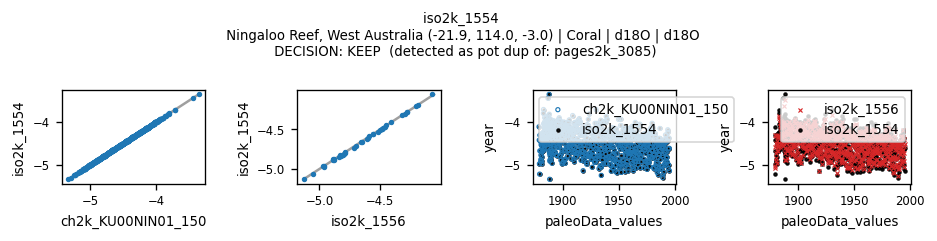

---------------------------------------------------------------------------------------------------------


332/429: **DECISION** Keep record 1 (ch2k_KU00NIN01_150, blue circles) [1], record 2 (iso2k_1556, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/331_ch2k_KU00NIN01_150_iso2k_1556__4173_4673.jpg
KEEP BLUE CIRCLES: keep ch2k_KU00NIN01_150, remove iso2k_1556.
write decision to backup file
4187 4188 98 332
> 333/429,ch2k_EV18ROC01_184,ch2k_EV18ROC01_186,0.0,1.0
=== POTENTIAL DUPLICATE 332/429: ch2k_EV18ROC01_184+ch2k_EV18ROC01_186 ===
=== URL 1: https://www.ncdc.noaa.gov/paleo/study/34373   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/34373   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  True
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data). Automatically choose #1.
KEEP BLUE CIRCLES: keep ch2k_EV18ROC01_184, remove ch2k_EV18ROC01_186.
write decision to backup file
4189 4478 98 333
> 334/429,ch2k_CA13SAP01_188,iso2k_569,0.0388

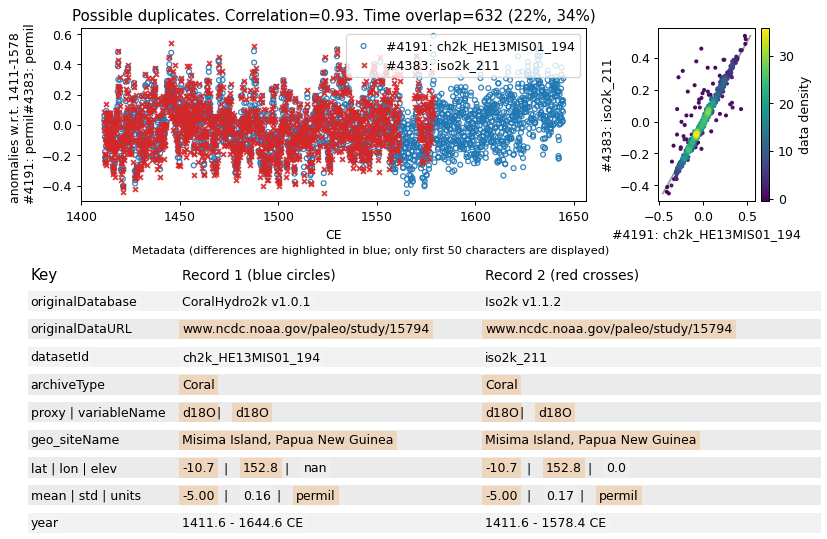

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
............................................................
     - Dataset ID          : iso2k_213
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/15794


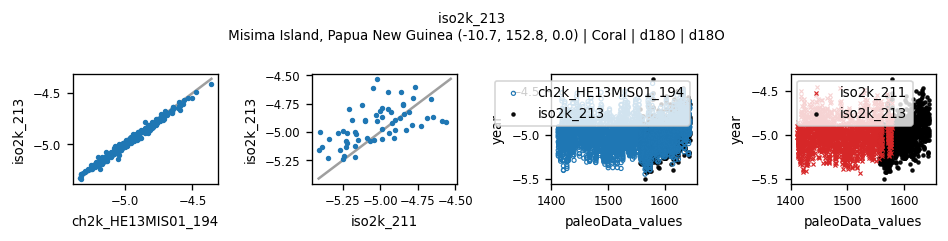

---------------------------------------------------------------------------------------------------------


335/429: **DECISION** Keep record 1 (ch2k_HE13MIS01_194, blue circles) [1], record 2 (iso2k_211, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: b


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/334_ch2k_HE13MIS01_194_iso2k_211__4191_4383.jpg
KEEP BOTH: keep ch2k_HE13MIS01_194, keep iso2k_211.
write decision to backup file
4191 4384 98 335
> 336/429,ch2k_HE13MIS01_194,iso2k_213,0.18098363234620218,0.993099103724861
=== POTENTIAL DUPLICATE 335/429: ch2k_HE13MIS01_194+iso2k_213 ===
=== URL 1: https://www.ncdc.noaa.gov/paleo/study/15794   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/15794   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  True
data_identical:  False
correlation_perfect:  False


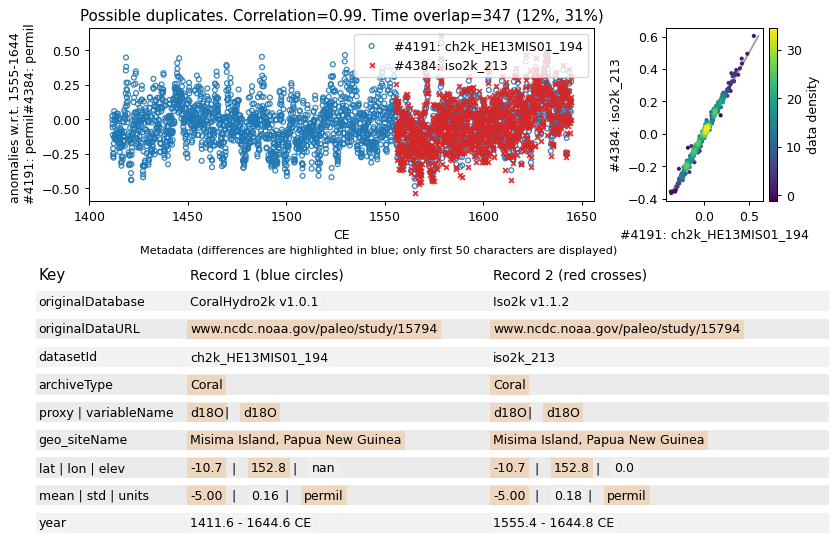

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
............................................................
     - Dataset ID          : iso2k_211
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/15794


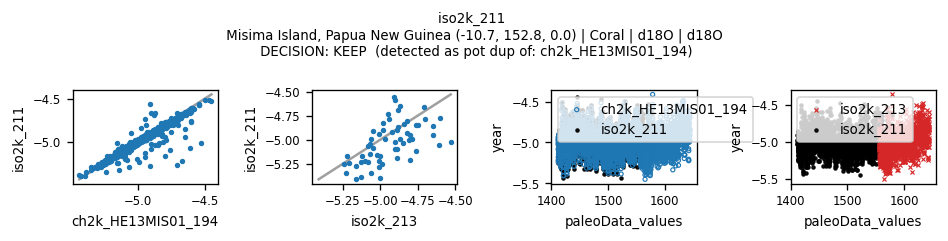

---------------------------------------------------------------------------------------------------------


336/429: **DECISION** Keep record 1 (ch2k_HE13MIS01_194, blue circles) [1], record 2 (iso2k_213, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/335_ch2k_HE13MIS01_194_iso2k_213__4191_4384.jpg
KEEP BLUE CIRCLES: keep ch2k_HE13MIS01_194, remove iso2k_213.
write decision to backup file
4193 4194 98 336
> 337/429,ch2k_ZI15IMP02_200,ch2k_ZI15IMP02_202,0.0,1.0
=== POTENTIAL DUPLICATE 336/429: ch2k_ZI15IMP02_200+ch2k_ZI15IMP02_202 ===
=== URL 1: https://www.ncdc.noaa.gov/paleo/study/19239   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/19239   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  True
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data). Automatically choose #1.
KEEP BLUE CIRCLES: keep ch2k_ZI15IMP02_200, remove ch2k_ZI15IMP02_202.
write decision to backup file
4195 4705 98 337
> 338/429,ch2k_PF04PBA01_204,iso2k_1701,0.0,1.0

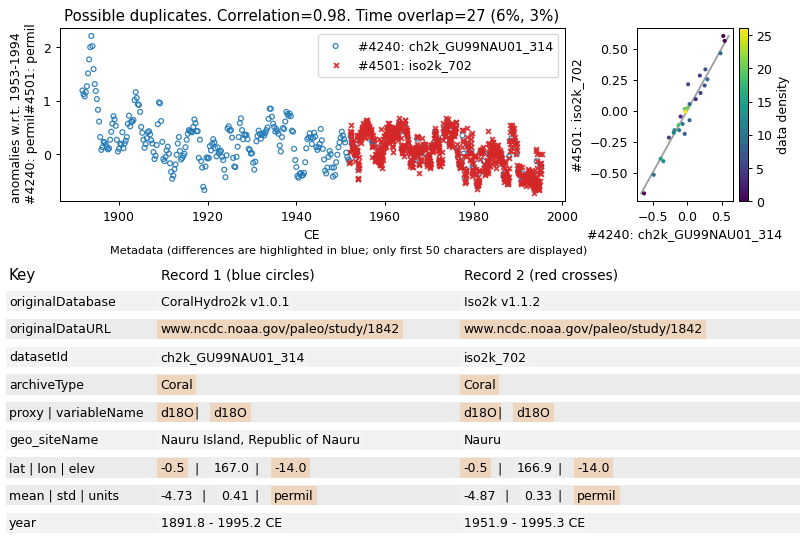

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
............................................................
     - Dataset ID          : iso2k_705
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/1842


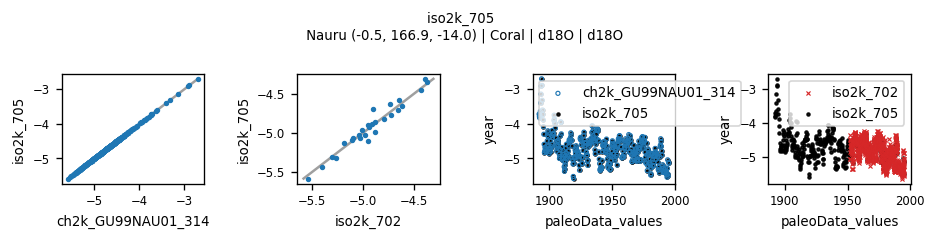

---------------------------------------------------------------------------------------------------------


351/429: **DECISION** Keep record 1 (ch2k_GU99NAU01_314, blue circles) [1], record 2 (iso2k_702, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/350_ch2k_GU99NAU01_314_iso2k_702__4240_4501.jpg
KEEP BLUE CIRCLES: keep ch2k_GU99NAU01_314, remove iso2k_702.
write decision to backup file
4240 4502 98 351
> 352/429,ch2k_GU99NAU01_314,iso2k_705,4.70176061145538,1.0
=== POTENTIAL DUPLICATE 351/429: ch2k_GU99NAU01_314+iso2k_705 ===
=== URL 1: https://www.ncdc.noaa.gov/paleo/study/1842   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/1842   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  True
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove ch2k_GU99NAU01_314, keep iso2k_705.
write decision to backup file
4243 4463 98 352
> 353/429,ch2k_CO03PAL10_324,iso2k_519,0.0,

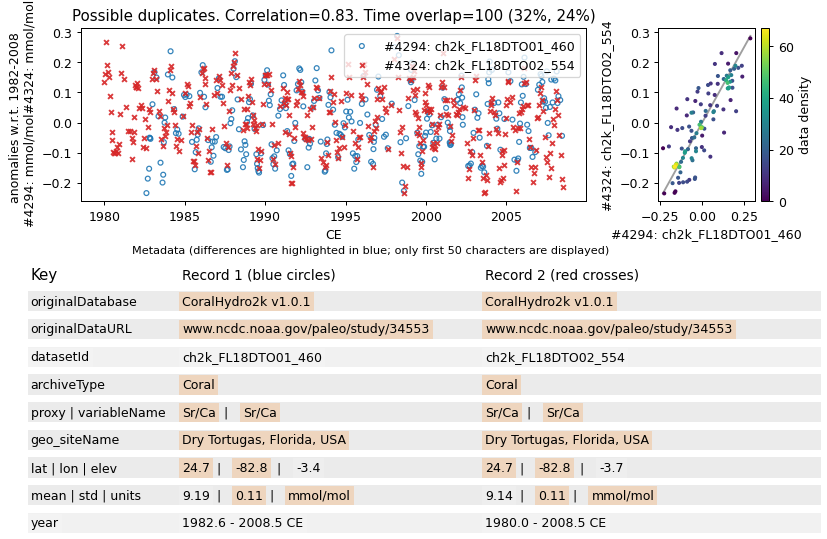

**Decision required for this duplicate pair (see figure above).**


373/429: **DECISION** Keep record 1 (ch2k_FL18DTO01_460, blue circles) [1], record 2 (ch2k_FL18DTO02_554, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: b


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/372_ch2k_FL18DTO01_460_ch2k_FL18DTO02_554__4294_4324.jpg
KEEP BOTH: keep ch2k_FL18DTO01_460, keep ch2k_FL18DTO02_554.
write decision to backup file
4297 4298 98 373
> 374/429,ch2k_DU94URV01_468,ch2k_DU94URV01_470,0.0,1.0
=== POTENTIAL DUPLICATE 373/429: ch2k_DU94URV01_468+ch2k_DU94URV01_470 ===
=== URL 1: https://www.ncdc.noaa.gov/paleo/study/1850   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/1850   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  True
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data). Automatically choose #1.
KEEP BLUE CIRCLES: keep ch2k_DU94URV01_468, remove ch2k_DU94URV01_470.
write decision to backup file
4299 4465 98 374
> 375/429,ch2k_CO03PAL08_472,iso2k_523,0.

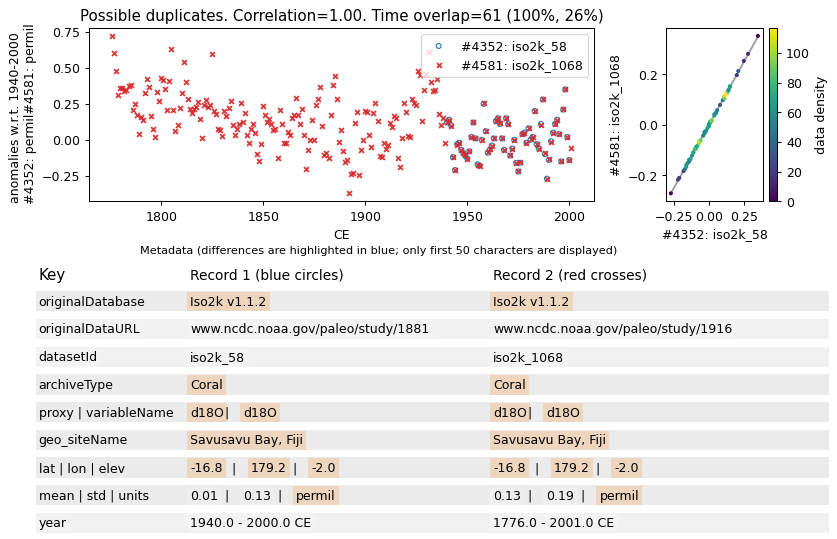

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  pages2k_267
---------------------------------------------------------------------------------------------------------


388/429: **DECISION** Keep record 1 (iso2k_58, blue circles) [1], record 2 (iso2k_1068, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/387_iso2k_58_iso2k_1068__4352_4581.jpg
KEEP RED CROSSES: remove iso2k_58, keep iso2k_1068.
write decision to backup file
4362 4363 98 388
> 389/429,iso2k_94,iso2k_98,0.0,1.0
=== POTENTIAL DUPLICATE 388/429: iso2k_94+iso2k_98 ===
=== URL 1: https://www.ncdc.noaa.gov/paleo/study/1859   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/1859   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  True
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data). Automatically choose #1.
KEEP BLUE CIRCLES: keep iso2k_94, remove iso2k_98.
write decision to backup file
4370 4945 98 389
> 390/429,iso2k_120,sisal_253.0_171,0.06728323958312438,1.0
=== POTENTIAL DUPLICATE 389/429: iso2k_120+sisal_253.0_171 ===
=== U

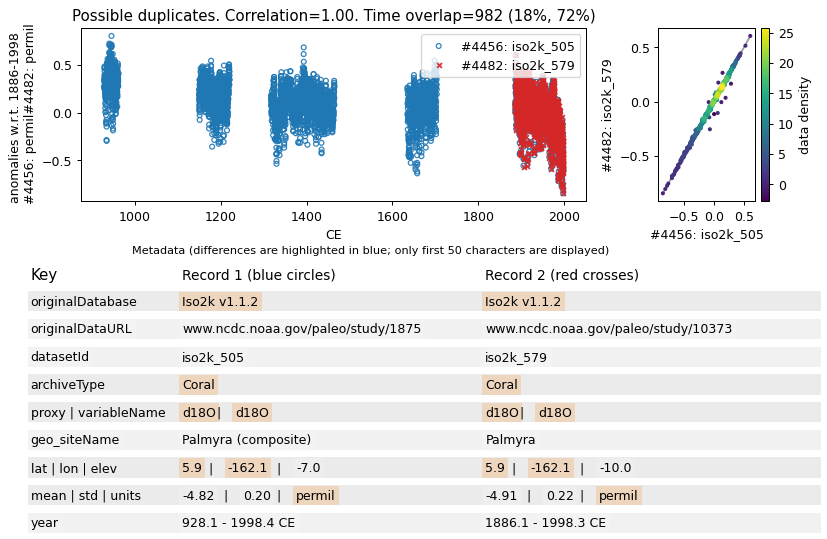

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  pages2k_1488
............................................................
     - Dataset ID          : pages2k_1628
     - URL                 : https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Palmyra.Cobb.2003.txt


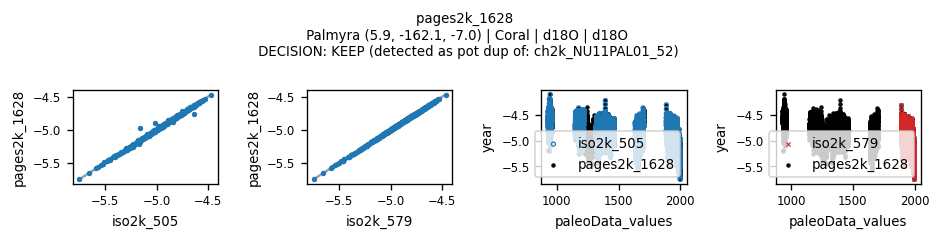

............................................................
     - Dataset ID          : ch2k_NU11PAL01_52
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10373


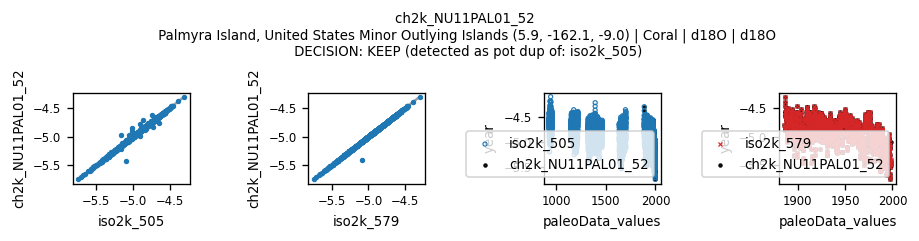

---------------------------------------------------------------------------------------------------------


399/429: **DECISION** Keep record 1 (iso2k_505, blue circles) [1], record 2 (iso2k_579, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: n


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/398_iso2k_505_iso2k_579__4456_4482.jpg
REMOVE BOTH: remove iso2k_579, remove iso2k_505.
write decision to backup file
4468 4843 98 399
> 400/429,iso2k_533,sisal_115.0_69,0.4944092732924204,0.9999999999999998
=== POTENTIAL DUPLICATE 399/429: iso2k_533+sisal_115.0_69 ===
=== URL 1: https://www.ncdc.noaa.gov/paleo-search/study/5427   ===
=== URL 2: ['10.1126/science.1091220']   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  False
lat True lon True elevation True archivetype False paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False


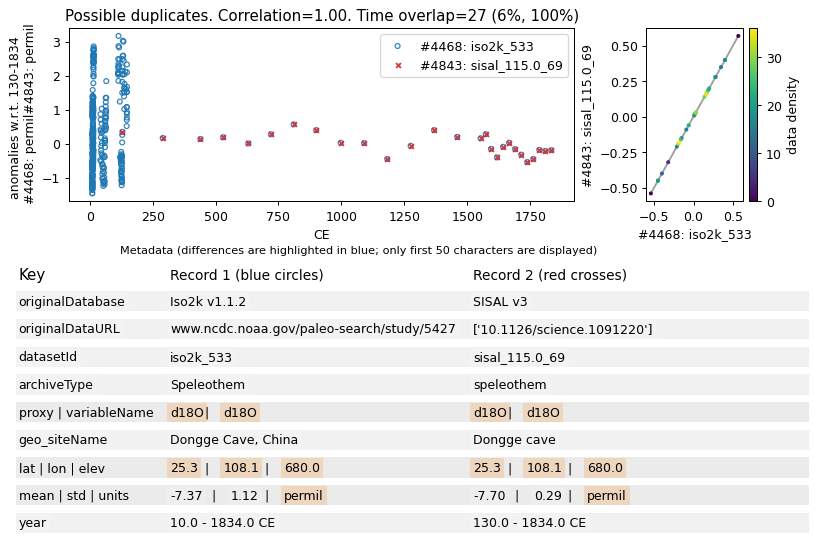

**Decision required for this duplicate pair (see figure above).**


400/429: **DECISION** Keep record 1 (iso2k_533, blue circles) [1], record 2 (sisal_115.0_69, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: b


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/399_iso2k_533_sisal_115.0_69__4468_4843.jpg
KEEP BOTH: keep iso2k_533, keep sisal_115.0_69.
write decision to backup file
4471 4473 98 400
> 401/429,iso2k_546,iso2k_549,0.0,0.9992915900641419
=== POTENTIAL DUPLICATE 400/429: iso2k_546+iso2k_549 ===
=== URL 1: this compilation   ===
=== URL 2: this compilation   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  True
data_identical:  False
correlation_perfect:  True
RECORDS IDENTICAL (perfect correlation). Automatically choose #1.
KEEP BLUE CIRCLES: keep iso2k_546, remove iso2k_549.
write decision to backup file
4472 4474 98 401
> 402/429,iso2k_547,iso2k_550,0.0,0.9996157576286442
=== POTENTIAL DUPLICATE 401/429: iso2k_547+iso2k_550 ===
=== URL 1: this compilation   ===
=== URL 

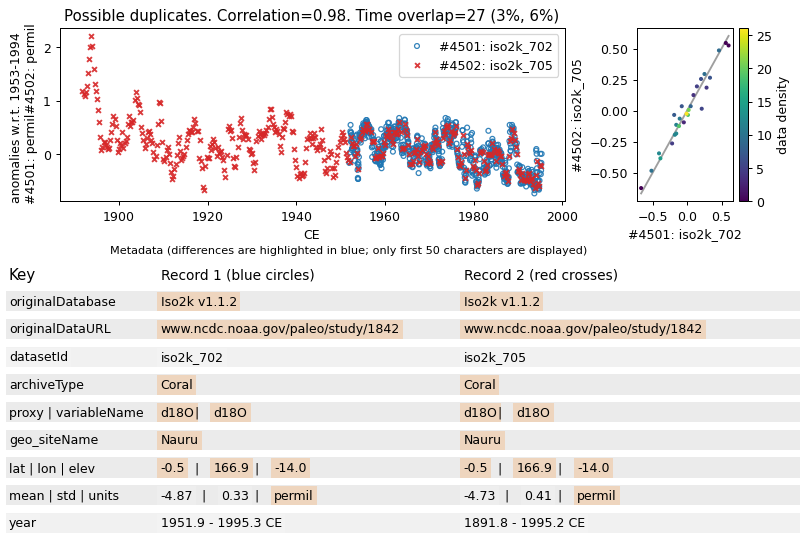

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  ch2k_GU99NAU01_314
---------------------------------------------------------------------------------------------------------


403/429: **DECISION** Keep record 1 (iso2k_702, blue circles) [1], record 2 (iso2k_705, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/402_iso2k_702_iso2k_705__4501_4502.jpg
KEEP RED CROSSES: remove iso2k_702, keep iso2k_705.
write decision to backup file
4514 4515 98 403
> 404/429,iso2k_772,iso2k_775,0.0,1.0
=== POTENTIAL DUPLICATE 403/429: iso2k_772+iso2k_775 ===
=== URL 1: https://www.ncdc.noaa.gov/paleo/study/9792   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/9792   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  True
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data). Automatically choose #1.
KEEP BLUE CIRCLES: keep iso2k_772, remove iso2k_775.
write decision to backup file
4518 4519 98 404
> 405/429,iso2k_786,iso2k_788,0.0,0.9997021095883626
=== POTENTIAL DUPLICATE 404/429: iso2k_786+iso2k_788 ===
=== URL 1: h

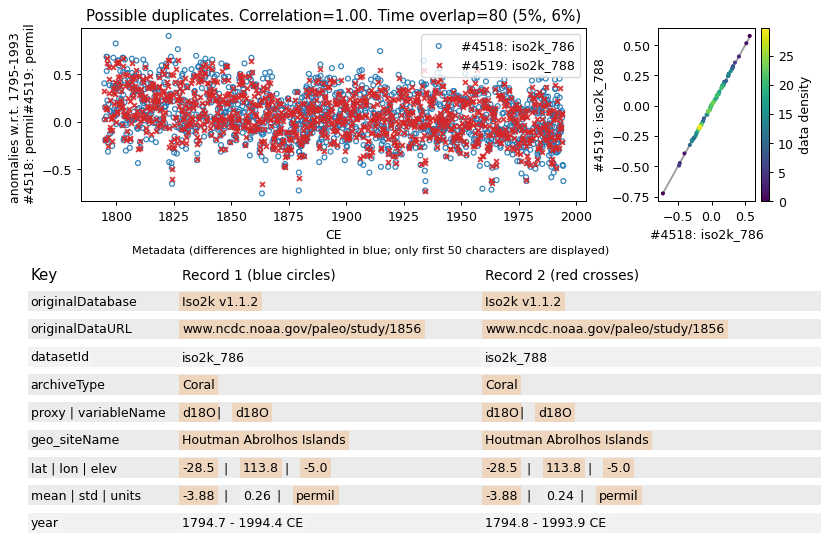

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  ch2k_KU99HOU01_40
---------------------------------------------------------------------------------------------------------


405/429: **DECISION** Keep record 1 (iso2k_786, blue circles) [1], record 2 (iso2k_788, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/404_iso2k_786_iso2k_788__4518_4519.jpg
KEEP BLUE CIRCLES: keep iso2k_786, remove iso2k_788.
write decision to backup file
4521 4522 98 405
> 406/429,iso2k_806,iso2k_811,0.0,1.0
=== POTENTIAL DUPLICATE 405/429: iso2k_806+iso2k_811 ===
=== URL 1: https://doi.org/10.25921/6e73-as97   ===
=== URL 2: https://doi.org/10.25921/6e73-as97   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  True
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data). Automatically choose #1.
KEEP BLUE CIRCLES: keep iso2k_806, remove iso2k_811.
write decision to backup file
4539 5088 98 406
> 407/429,iso2k_873,sisal_471.0_314,2.2239525755535694,0.9919284483744666
=== POTENTIAL DUPLICATE 406/429: iso2k_873+sisal_471.0_314 ===


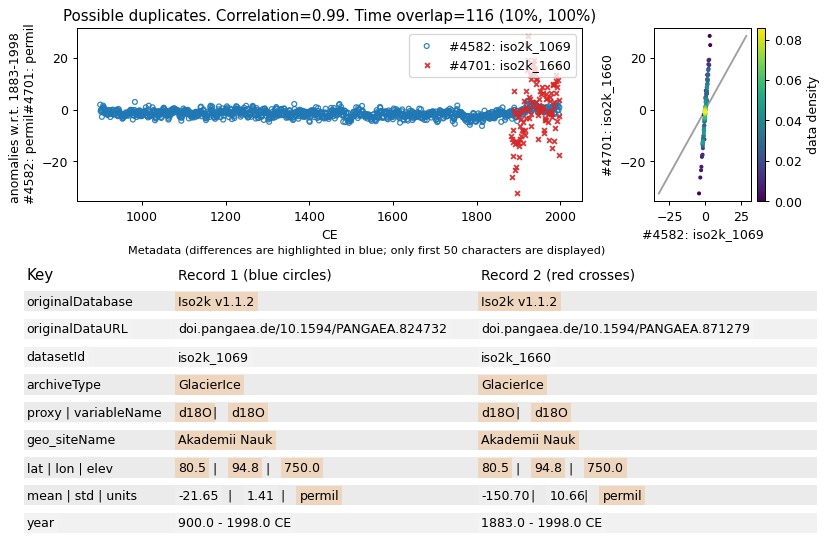

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  pages2k_3599
---------------------------------------------------------------------------------------------------------


408/429: **DECISION** Keep record 1 (iso2k_1069, blue circles) [1], record 2 (iso2k_1660, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: b


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/407_iso2k_1069_iso2k_1660__4582_4701.jpg
KEEP BOTH: keep iso2k_1069, keep iso2k_1660.
write decision to backup file
4588 4737 98 408
> 409/429,iso2k_1107,iso2k_1817,0.0,1.0
=== POTENTIAL DUPLICATE 408/429: iso2k_1107+iso2k_1817 ===
=== URL 1: https://www.ncdc.noaa.gov/paleo/study/8640   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo-search/study/9741   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data) except for metadata. Automatically choose #1.
KEEP BLUE CIRCLES: keep iso2k_1107, remove iso2k_1817.
write decision to backup file
4588 4948 98 409
> 410/429,iso2k_1107,sisal_271.0_174,0.44453600976202207,1.0
=== POTENTIAL DUPLICATE 409/429:

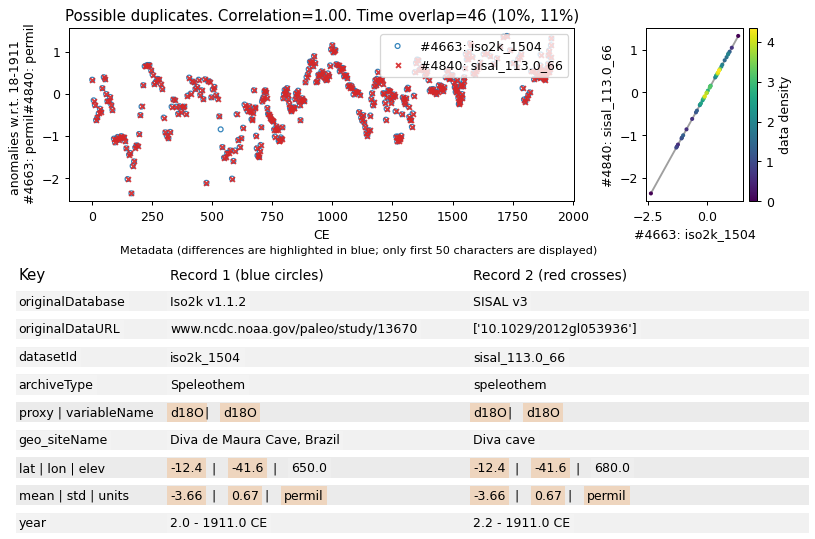

**Decision required for this duplicate pair (see figure above).**


416/429: **DECISION** Keep record 1 (iso2k_1504, blue circles) [1], record 2 (sisal_113.0_66, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/415_iso2k_1504_sisal_113.0_66__4663_4840.jpg
KEEP BLUE CIRCLES: keep iso2k_1504, remove sisal_113.0_66.
write decision to backup file
4672 4673 98 416
> 417/429,iso2k_1554,iso2k_1556,0.0,0.9995653924115724
=== POTENTIAL DUPLICATE 416/429: iso2k_1554+iso2k_1556 ===
=== URL 1: https://www.ncdc.noaa.gov/paleo/study/1867   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/1867   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  True
data_identical:  False
correlation_perfect:  False


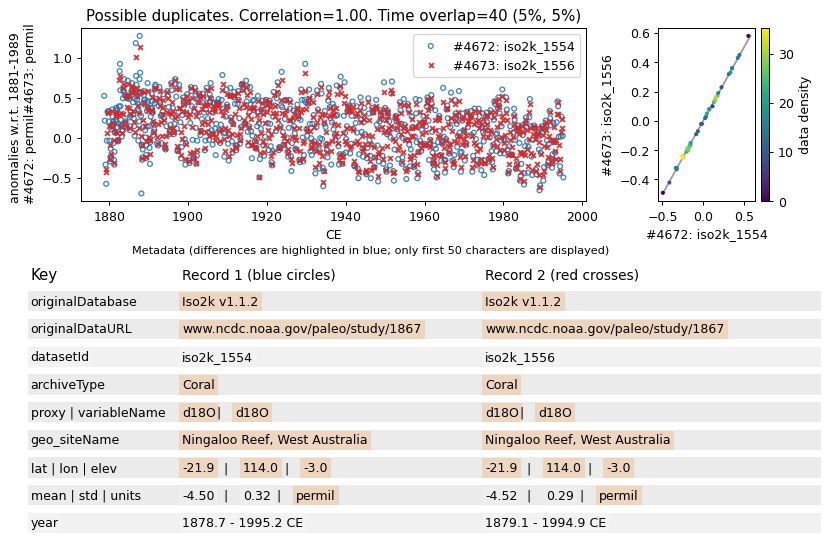

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  pages2k_3085
............................................................
     - Dataset ID          : ch2k_KU00NIN01_150
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/1867


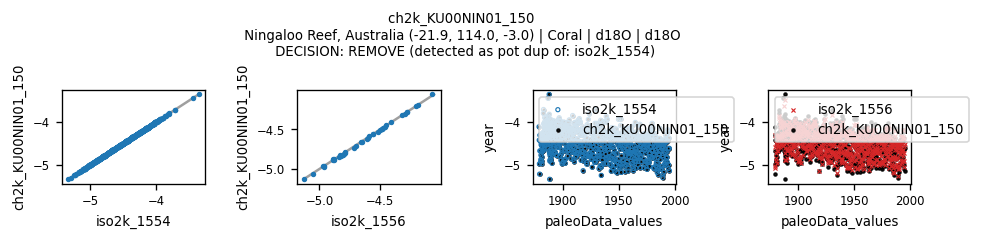

---------------------------------------------------------------------------------------------------------


417/429: **DECISION** Keep record 1 (iso2k_1554, blue circles) [1], record 2 (iso2k_1556, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]?  [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k_v2.0/dod2k/figs//dup_detection/all_merged/416_iso2k_1554_iso2k_1556__4672_4673.jpg
KEEP RED CROSSES: remove iso2k_1554, keep iso2k_1556.
write decision to backup file
4705 4706 98 417
> 418/429,iso2k_1701,iso2k_1704,0.0,1.0
=== POTENTIAL DUPLICATE 417/429: iso2k_1701+iso2k_1704 ===
=== URL 1: https://www.ncdc.noaa.gov/paleo/study/1891   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/1891   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  True
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data). Automatically choose #1.
KEEP BLUE CIRCLES: keep iso2k_1701, remove iso2k_1704.
write decision to backup file
4737 4948 98 418
> 419/429,iso2k_1817,sisal_271.0_174,0.44453600976202207,1.0
=== POTENTIAL DUPLICATE 418/429: iso2k_1817+sisal_2

Type your comment on your decision process here and/or press enter: test


(429, 27)
Saved the decisions under data/all_merged/dup_detection/dup_decisions_all_merged_LL_25-12-11.csv
Summary of all decisions made:
#0: REMOVE record pages2k_0. KEEP record iso2k_296.
#1: REMOVE record pages2k_0. KEEP record iso2k_298.
#2: REMOVE record pages2k_0. KEEP record iso2k_299.
#3: REMOVE record pages2k_6. KEEP record FE23_northamerica_usa_az555.
#4: REMOVE record pages2k_50. KEEP record FE23_northamerica_canada_cana091.
#5: KEEP record pages2k_62. KEEP record pages2k_63.
#6: REMOVE record pages2k_81. KEEP record ch2k_HE08LRA01_76.
#7: REMOVE record pages2k_81. KEEP record iso2k_1813.
#8: REMOVE record pages2k_83. KEEP record iso2k_1916.
#9: KEEP record pages2k_85. REMOVE record pages2k_88.
#10: REMOVE record pages2k_94. KEEP record FE23_northamerica_canada_cana153.
#11: REMOVE record pages2k_107. KEEP record FE23_northamerica_usa_ak046.
#12: KEEP record pages2k_121. REMOVE record pages2k_122.
#13: REMOVE record pages2k_132. KEEP record FE23_northamerica_canada_cana225.


In [30]:
# remove_identicals = True if you want to automatically remove identical duplicates, without operator input
dup.duplicate_decisions_multiple(df, operator_details=operator_details, choose_recollection=True, 
                                 remove_identicals=True, backup=True, comment=True, automate_db_choice=automate_db_choice)

In [31]:
date = str(datetime.datetime.utcnow())[2:10]
fn   = utf.find(f'dup_decisions_{df.name}_{initials}_{date}.csv', f'data/{df.name}/dup_detection')

if fn != []:
    print('----------------------------------------------------')
    print('Successfully finished the duplicate decision process!'.upper())
    print('----------------------------------------------------')
    print('Saved the decision output file in:')
    print()
    for ff in fn:
        print('%s.'%ff)
    print()
    print('You are now able to proceed with the next notebook: dup_removal.ipynb')
else:
    print('!!!!!!!!!!!!WARNING!!!!!!!!!!!')
    print('Final output file is missing.')
    print()
    print('Please re-run the notebook to complete duplicate decision process.')

----------------------------------------------------
SUCCESSFULLY FINISHED THE DUPLICATE DECISION PROCESS!
----------------------------------------------------
Saved the decision output file in:

data/all_merged/dup_detection/dup_decisions_all_merged_LL_25-12-11.csv.

You are now able to proceed with the next notebook: dup_removal.ipynb
